# Visualising high-dimentional datasetsusing t-SNE

The following program utilises the MNIST dataset for visualisation

In [7]:
# Import libraries
import os

import torch
import torchvision
import torch.utils.data as Data
from torchvision import transforms, datasets
import matplotlib.pyplot as plt

%matplotlib inline

In [8]:
# Hyperparameters
EPOCH = 1
BATCH_SIZE = 20 # from 20 -50
LEARNING_RATE = 0.001

In [9]:
train_data = datasets.MNIST(root='mnist', train=True, 
                            download=True, transform=transforms.ToTensor())
test_data = torchvision.datasets.MNIST(root='mnist', train=False)
test_x = torch.unsqueeze(test_data.test_data, dim=1).type(torch.FloatTensor)[:2000]/255.0
test_y = test_data.test_labels[:2000]

## Display Sample Data

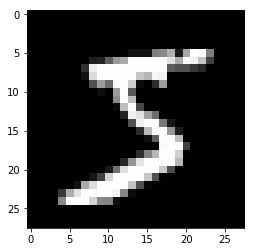

In [10]:
plt.imshow(train_data.train_data[0].numpy(), cmap='gray')
plt.show()

In [30]:
# Data Loader for mini-batch training
train_loader = Data.DataLoader(dataset=train_data, batch_size=BATCH_SIZE, shuffle=True)


## Define the CNN

In [3]:
import torch.nn.functional as F

class CNN(torch.nn.Module):
    def __init__(self):
        super(CNN, self).__init__()
        self.conv1 = torch.nn.Sequential(
            torch.nn.Conv2d(
                in_channels = 1,
                out_channels = 16,
                kernel_size = 5,
                stride = 1,
                padding = 2
            ),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = torch.nn.Sequential(
            torch.nn.Conv2d(16, 32, 5, 1, 2),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(2)
        )
        self.out = torch.nn.Linear(32 * 7 * 7, 10)
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.view(x.size(0), -1)
        output = self.out(x)
        return output, x

In [5]:
cnn = CNN()
print(cnn)
optimizer = torch.optim.Adam(cnn.parameters(), lr=0.001)
loss_func = torch.nn.CrossEntropyLoss()

CNN(
  (conv1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (out): Linear(in_features=1568, out_features=10, bias=True)
)


## Visualize output
matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)

__figsize__: width & height in inches

__dpi__: resolution of the figure

__facecolor__: the background color

__edgecolor__: the border color

In [25]:
# import color map
from matplotlib import cm
from matplotlib.pyplot import figure
import matplotlib.patches as mpatches

from sklearn.manifold import TSNE

In [36]:
def low_dimm_visualization(low_dimm_weights, labels):
    figure(num=None, figsize=(8,6), dpi=80, facecolor='w', edgecolor='k')
    # clear current axis
    plt.cla()
    X, Y = low_dimm_weights[:, 0], low_dimm_weights[:, 1]
    colors = []
    for label in labels:
        c = cm.rainbow(int(255 * label / 9))
        colors.append(c)
    
    # Plot scatter graph
    plt.scatter(X, Y, c=colors, label=colors)
    plt.xlim(X.min(), X.max())
    plt.ylim(Y.min(), Y.max())
    plt.title('Low Dimmension Visualization')
    
    # Legends
    classes = []
    class_colors = []
    for i in range(10):
        classes.append(i)
        class_colors.append(cm.rainbow(int(255 * i / 9)))

    rects = []
    for i in range(len(class_colors)):
        rects.append(mpatches.Rectangle((0,0), 1, 1, fc=class_colors[i]))
    
    # ncol: number of columns
    plt.legend(rects, classes, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

## Training

Epoch:  0 | train loss: 2.2296 | test accuracy: 0.23


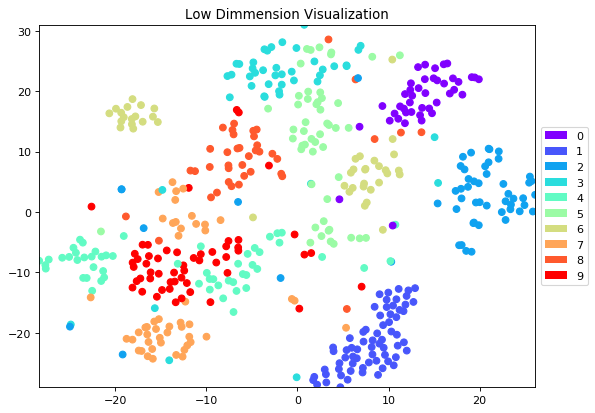

Epoch:  0 | train loss: 1.5225 | test accuracy: 0.71


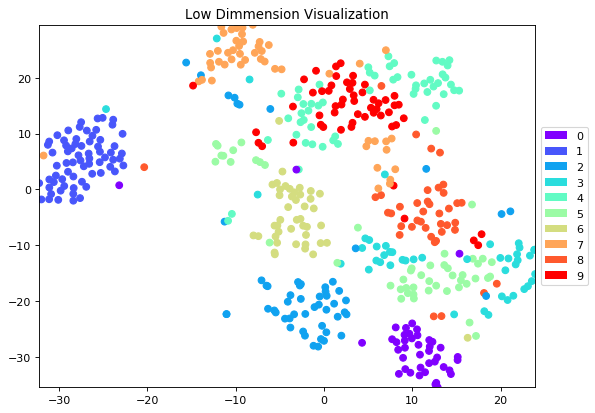

Epoch:  0 | train loss: 0.3059 | test accuracy: 0.74


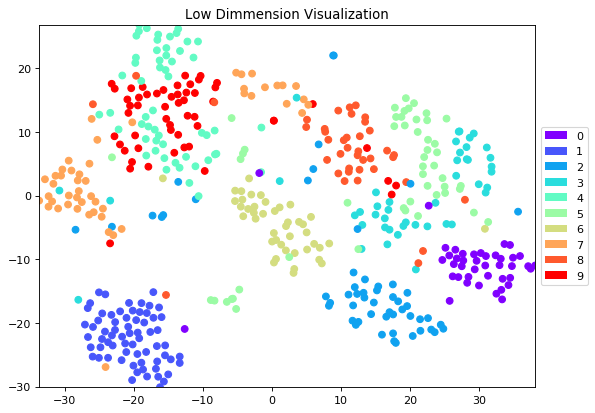

Epoch:  0 | train loss: 1.0708 | test accuracy: 0.81


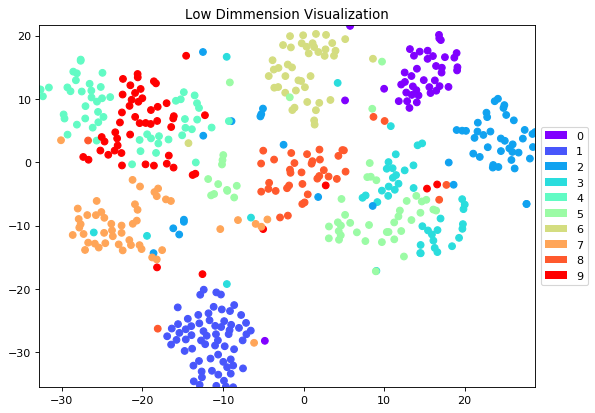

Epoch:  0 | train loss: 0.3132 | test accuracy: 0.82


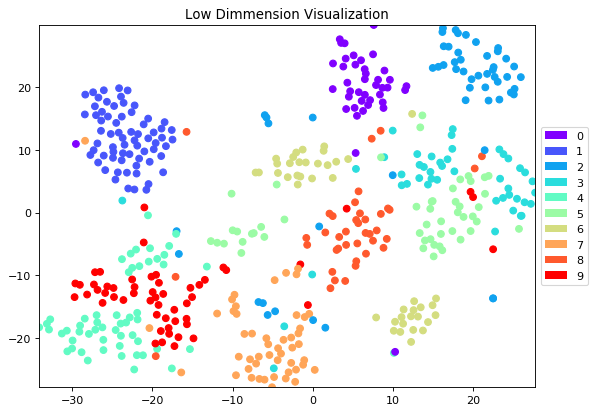

Epoch:  0 | train loss: 0.0993 | test accuracy: 0.86


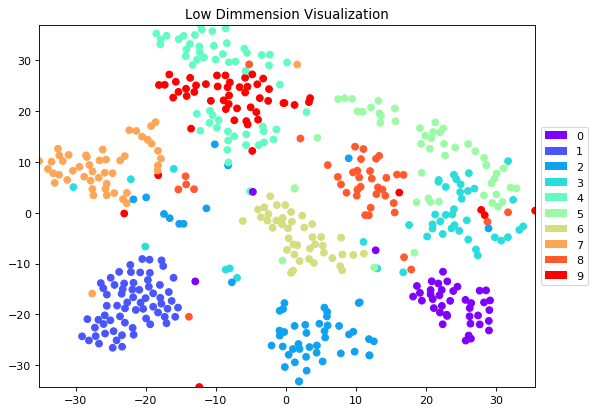

Epoch:  0 | train loss: 0.2356 | test accuracy: 0.90


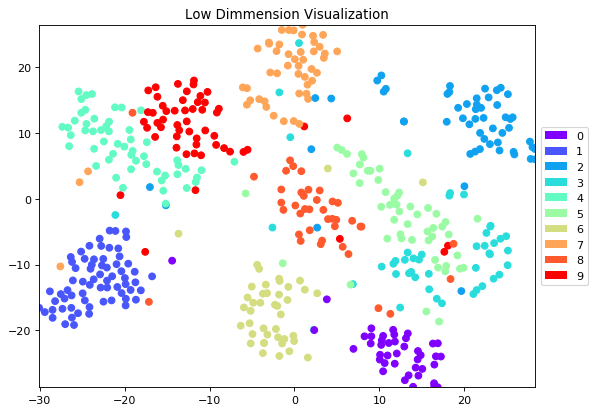

Epoch:  0 | train loss: 0.0816 | test accuracy: 0.91


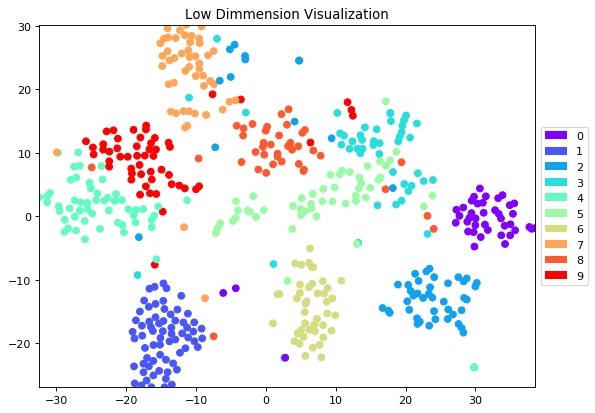

Epoch:  0 | train loss: 0.3227 | test accuracy: 0.91


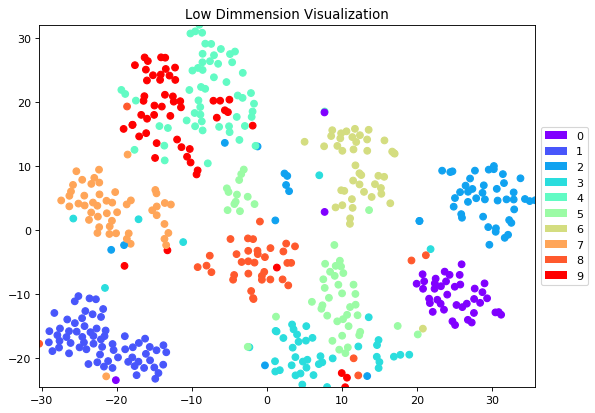

Epoch:  0 | train loss: 0.1710 | test accuracy: 0.91


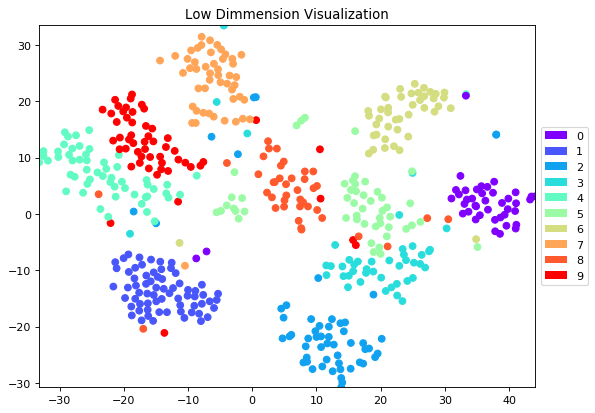

Epoch:  0 | train loss: 0.0615 | test accuracy: 0.92


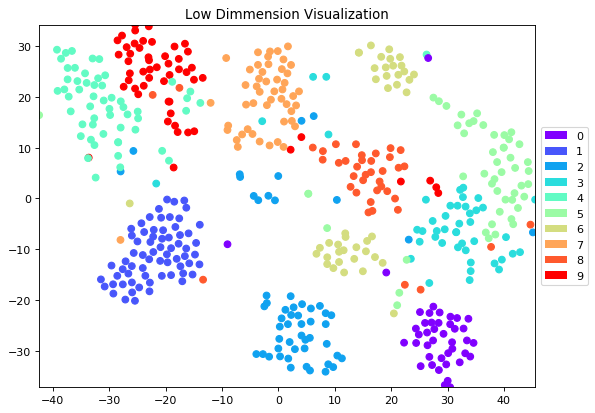

Epoch:  0 | train loss: 0.3772 | test accuracy: 0.93


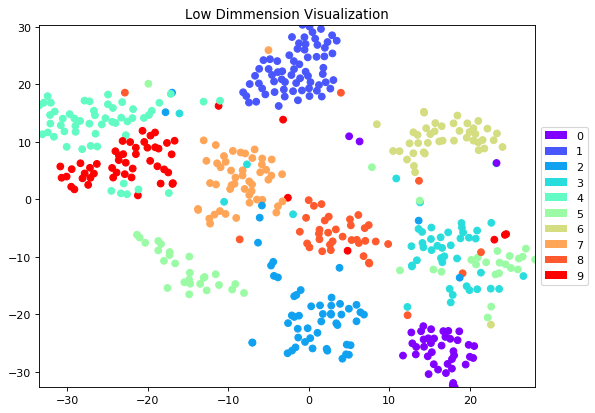

Epoch:  0 | train loss: 0.0989 | test accuracy: 0.94


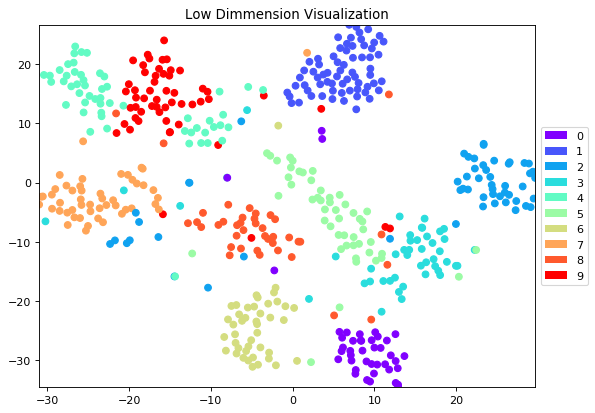

Epoch:  0 | train loss: 0.1495 | test accuracy: 0.93


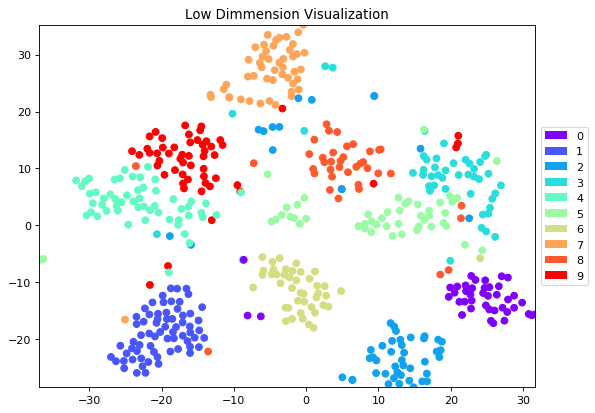

Epoch:  0 | train loss: 0.1607 | test accuracy: 0.94


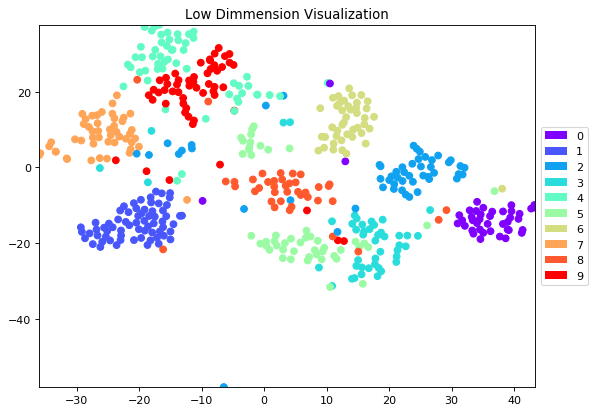

Epoch:  0 | train loss: 0.1394 | test accuracy: 0.94


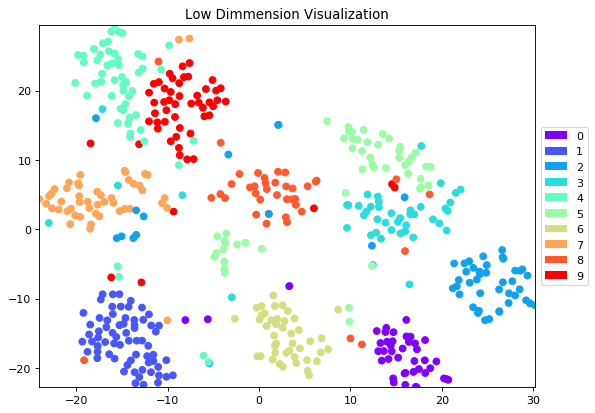

Epoch:  0 | train loss: 0.0123 | test accuracy: 0.94


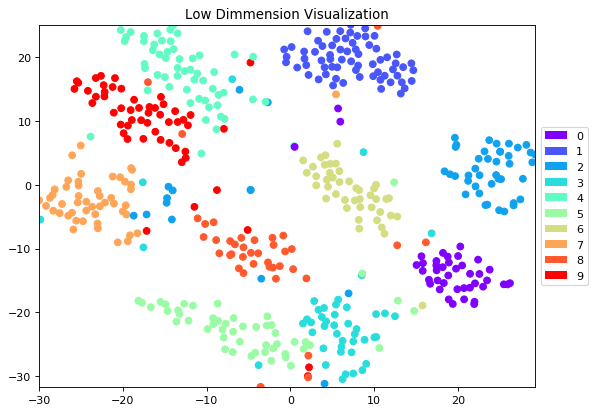

Epoch:  0 | train loss: 0.1581 | test accuracy: 0.94


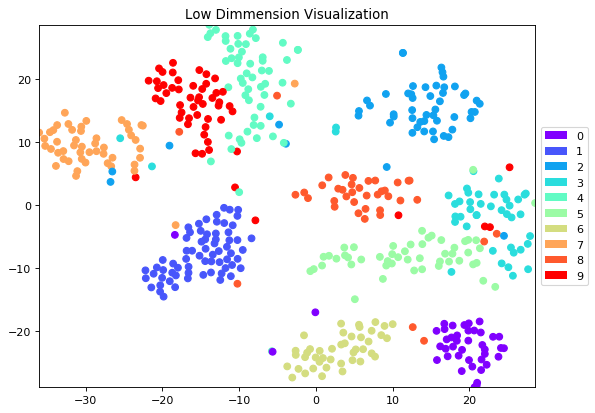

Epoch:  0 | train loss: 0.1156 | test accuracy: 0.94


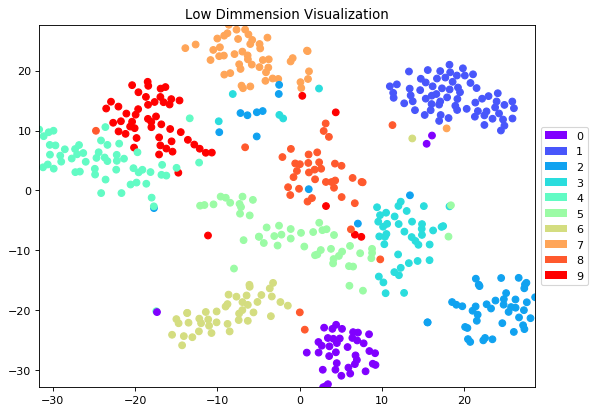

Epoch:  0 | train loss: 0.0807 | test accuracy: 0.91


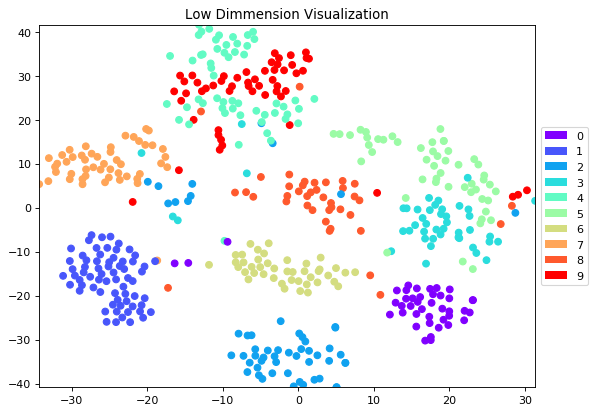

Epoch:  0 | train loss: 0.6176 | test accuracy: 0.94


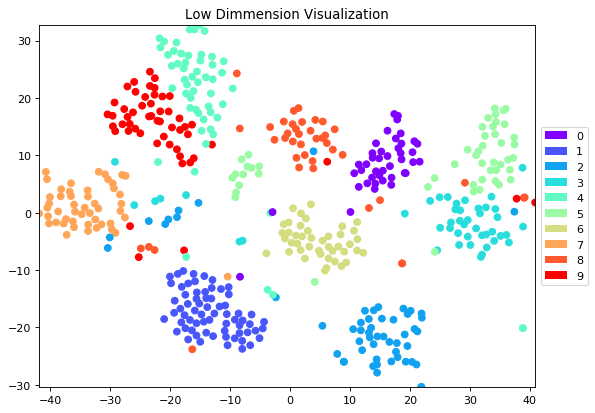

Epoch:  0 | train loss: 0.2180 | test accuracy: 0.95


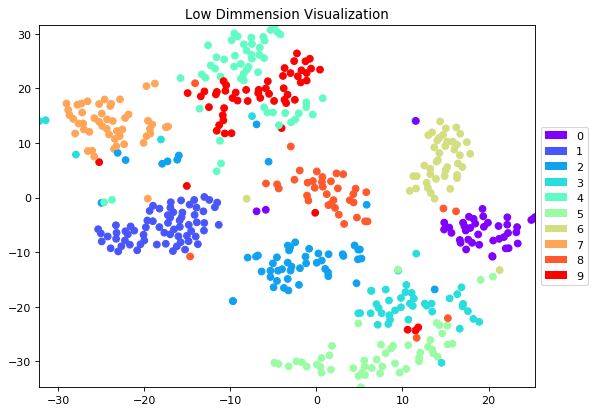

Epoch:  0 | train loss: 0.2606 | test accuracy: 0.95


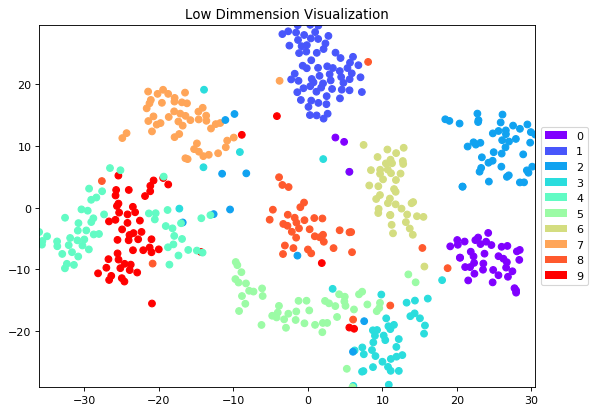

Epoch:  0 | train loss: 0.0674 | test accuracy: 0.95


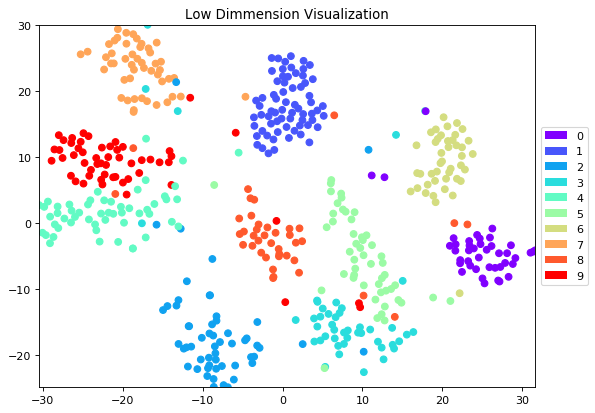

Epoch:  0 | train loss: 0.0108 | test accuracy: 0.96


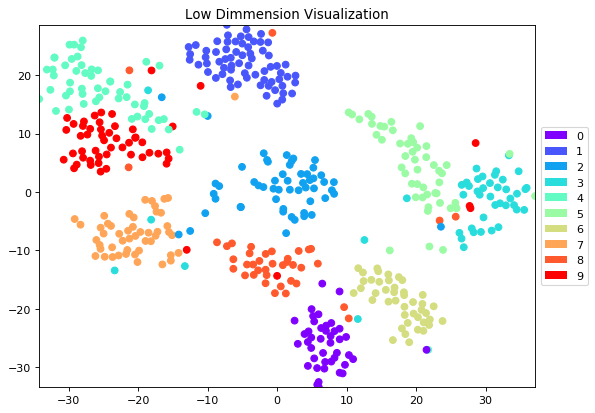

Epoch:  0 | train loss: 0.2684 | test accuracy: 0.94


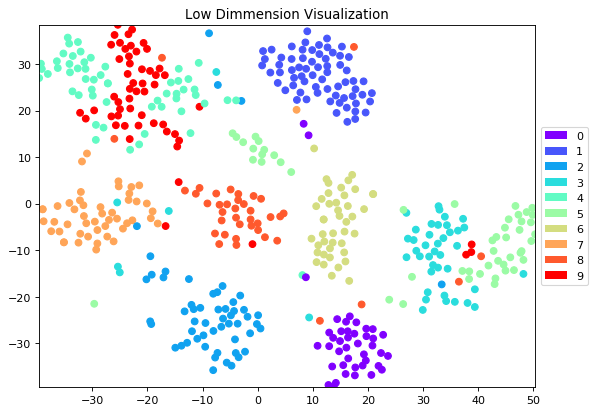

Epoch:  0 | train loss: 0.0479 | test accuracy: 0.96


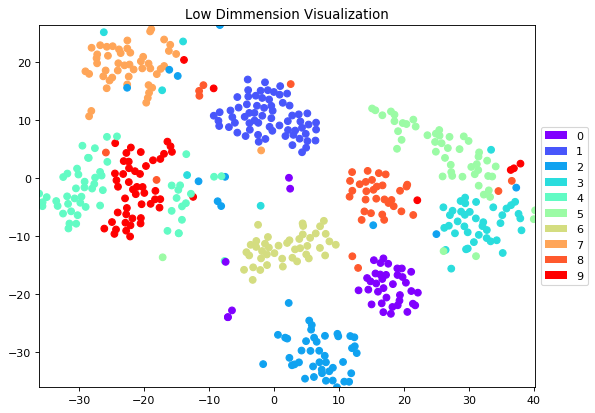

Epoch:  0 | train loss: 0.0745 | test accuracy: 0.96


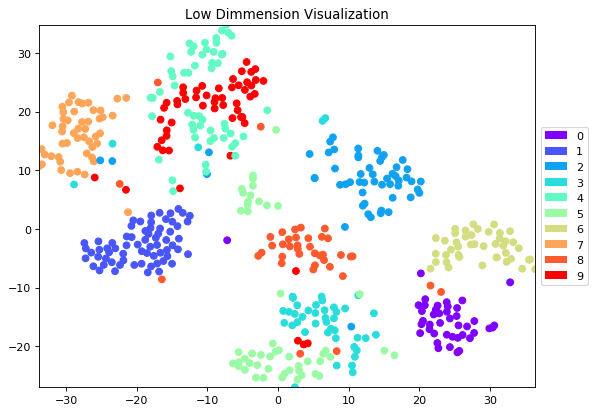

Epoch:  0 | train loss: 0.5477 | test accuracy: 0.95


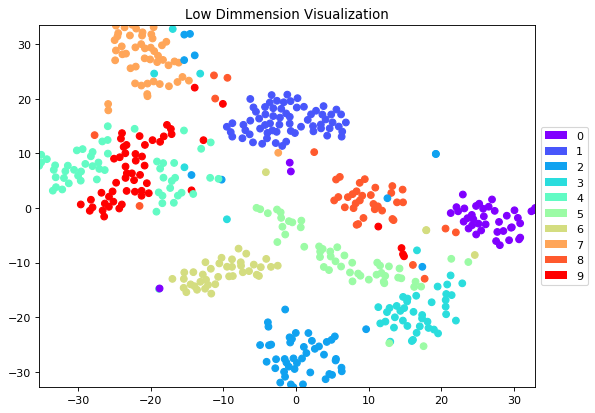

Epoch:  0 | train loss: 0.0705 | test accuracy: 0.95


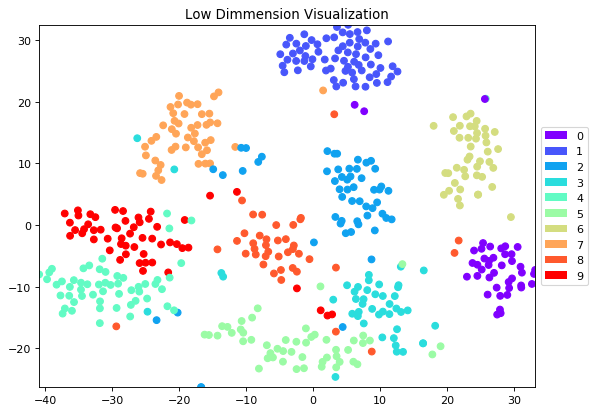

Epoch:  0 | train loss: 0.0862 | test accuracy: 0.95


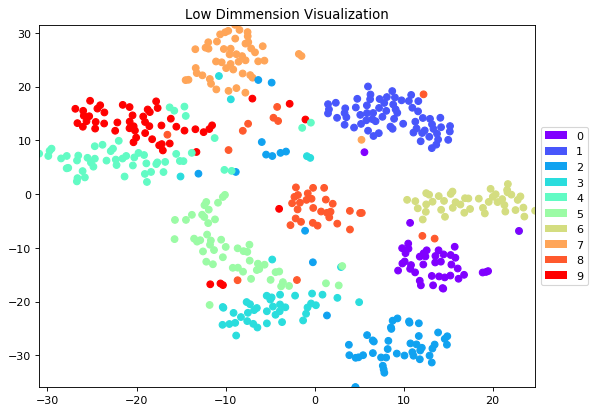

Epoch:  0 | train loss: 0.1514 | test accuracy: 0.95


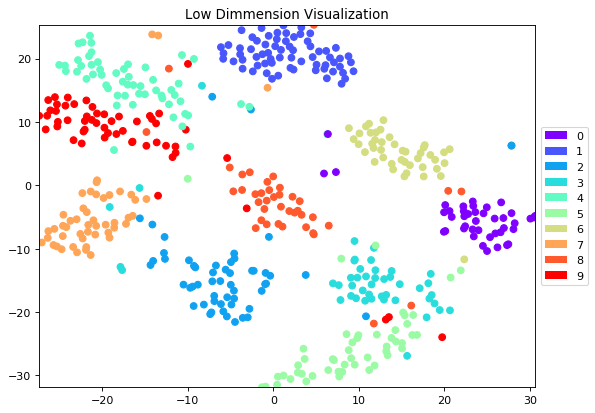

Epoch:  0 | train loss: 0.2271 | test accuracy: 0.95


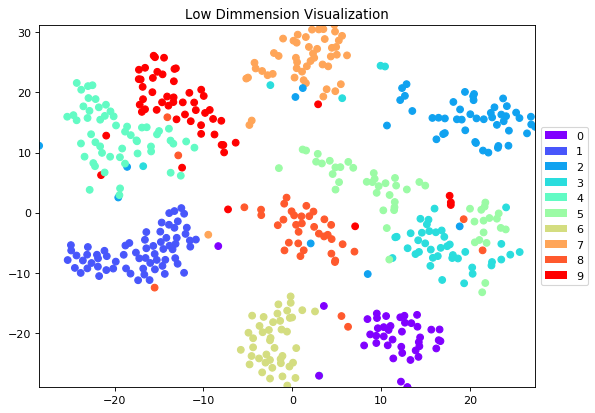

Epoch:  0 | train loss: 0.2119 | test accuracy: 0.95


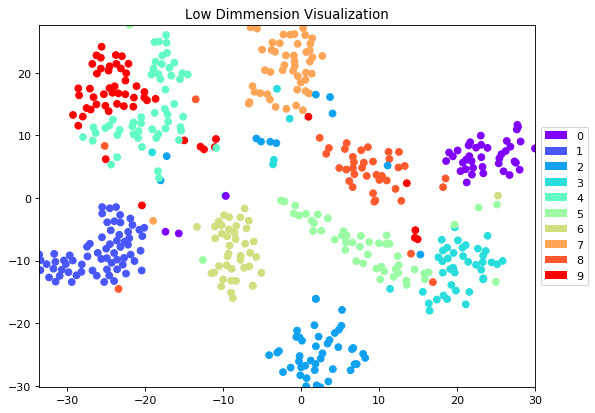

Epoch:  0 | train loss: 0.0877 | test accuracy: 0.96


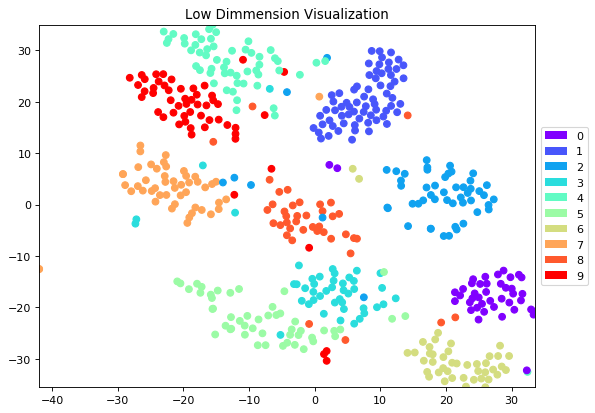

Epoch:  0 | train loss: 0.3044 | test accuracy: 0.96


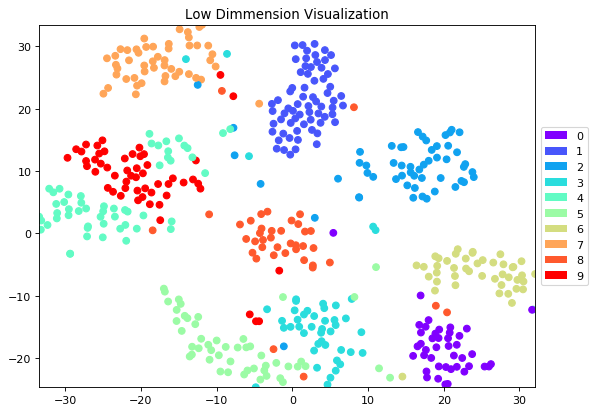

Epoch:  0 | train loss: 0.2327 | test accuracy: 0.96


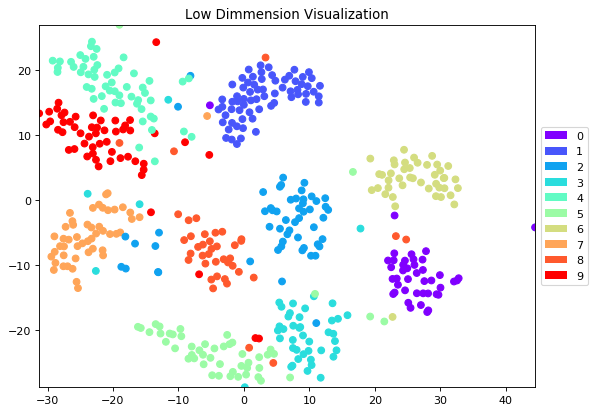

Epoch:  0 | train loss: 0.1724 | test accuracy: 0.96


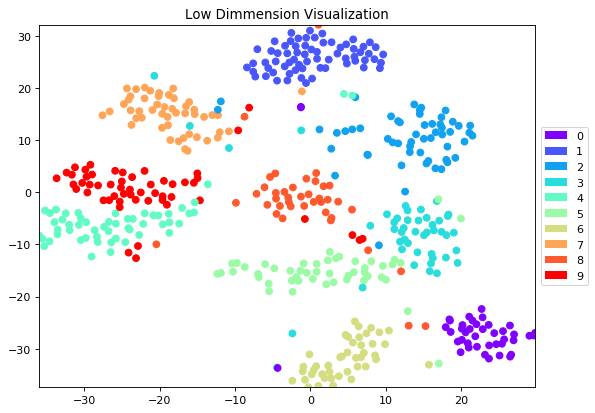

Epoch:  0 | train loss: 0.0697 | test accuracy: 0.96


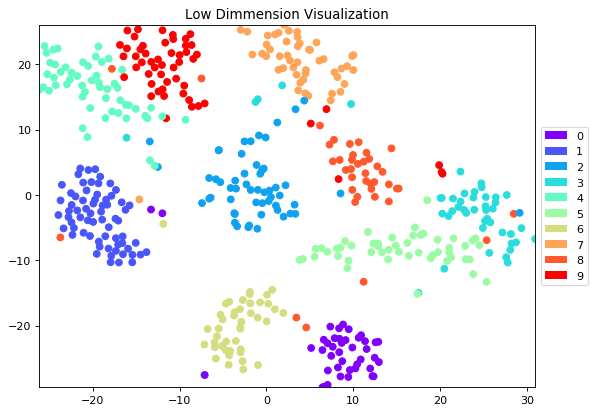

Epoch:  0 | train loss: 0.0302 | test accuracy: 0.97


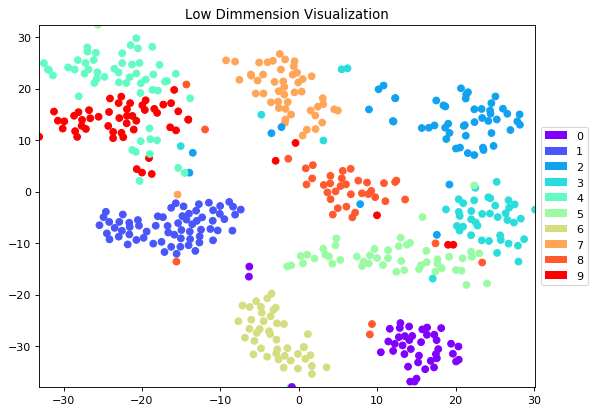

Epoch:  0 | train loss: 0.0886 | test accuracy: 0.96


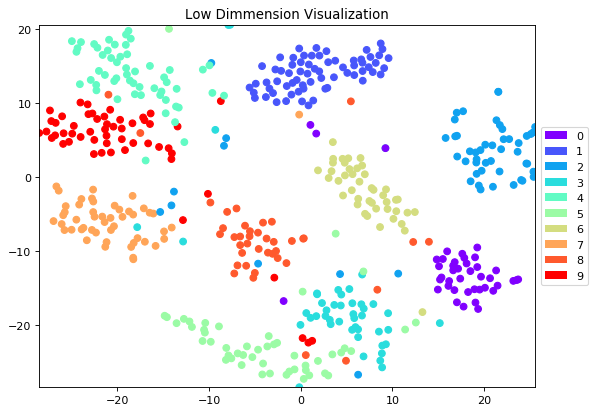

Epoch:  0 | train loss: 0.0054 | test accuracy: 0.97


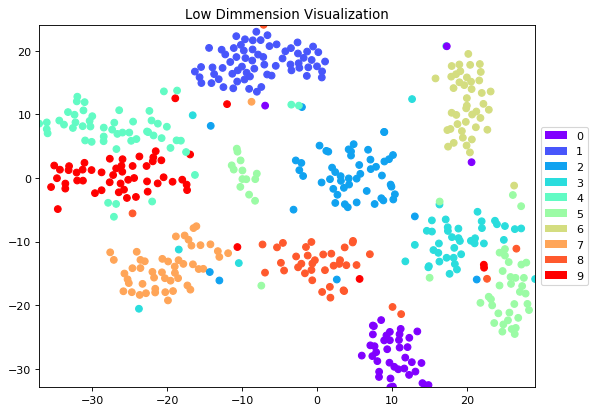

Epoch:  0 | train loss: 0.0295 | test accuracy: 0.97


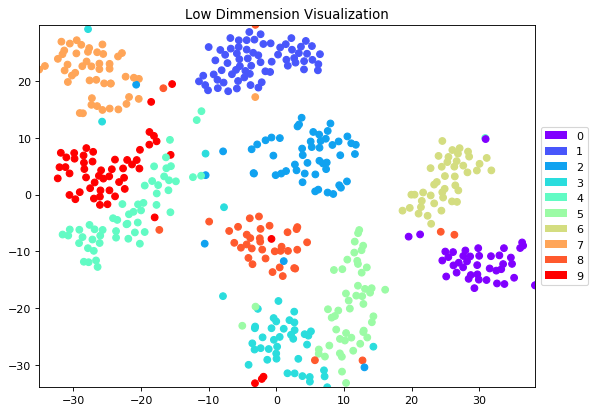

Epoch:  0 | train loss: 0.0979 | test accuracy: 0.96


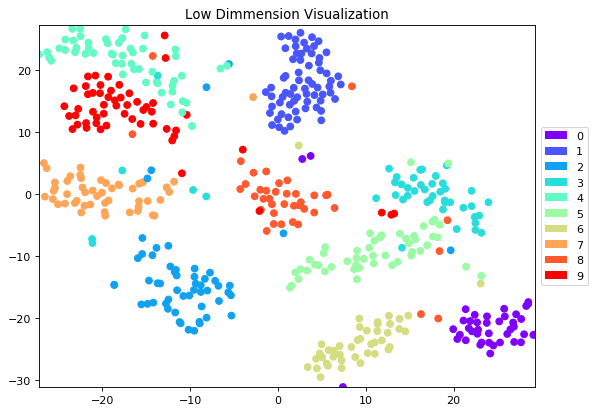

Epoch:  0 | train loss: 0.0389 | test accuracy: 0.97


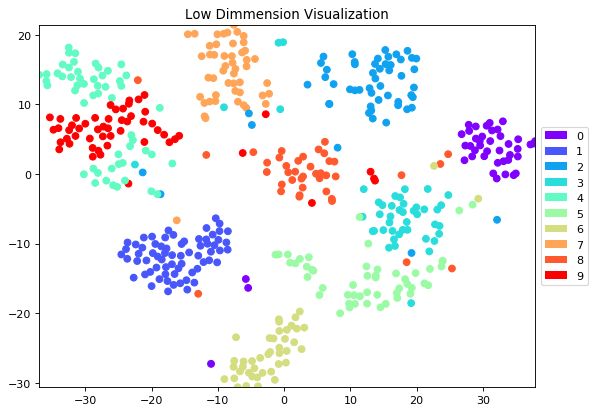

Epoch:  0 | train loss: 0.0378 | test accuracy: 0.97


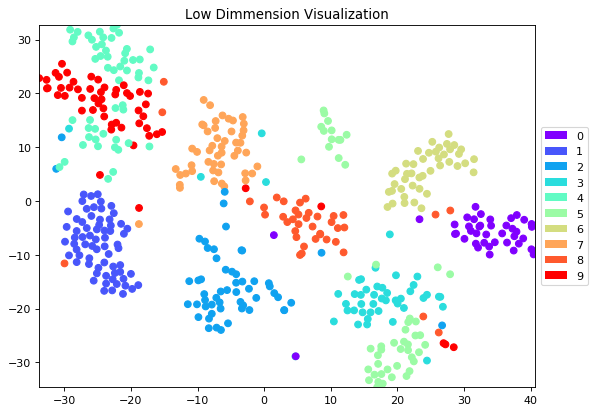

Epoch:  0 | train loss: 0.3373 | test accuracy: 0.96


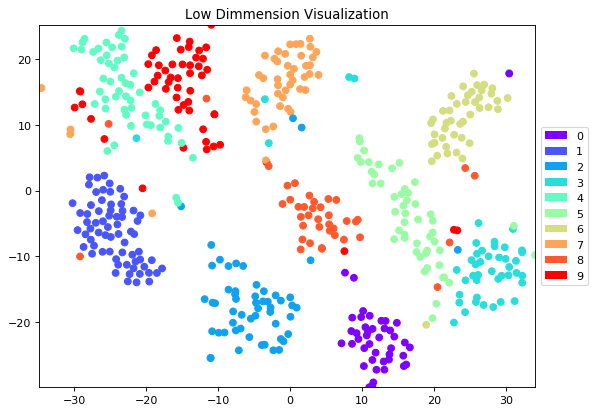

Epoch:  0 | train loss: 0.0413 | test accuracy: 0.96


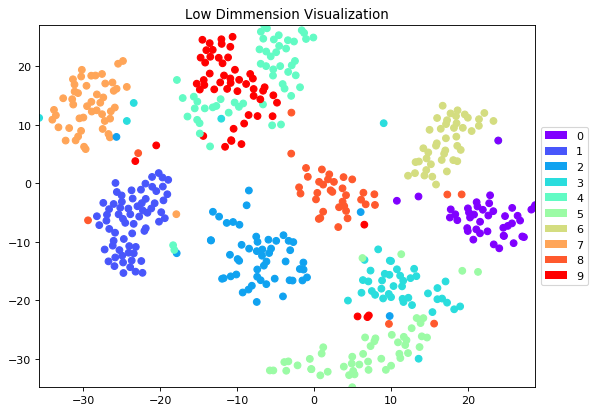

Epoch:  0 | train loss: 0.0960 | test accuracy: 0.97


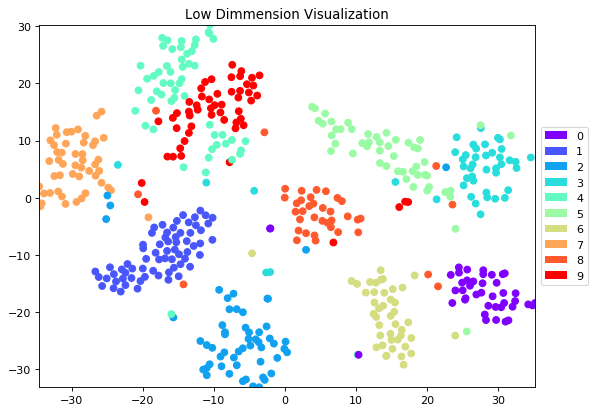

Epoch:  0 | train loss: 0.0141 | test accuracy: 0.97


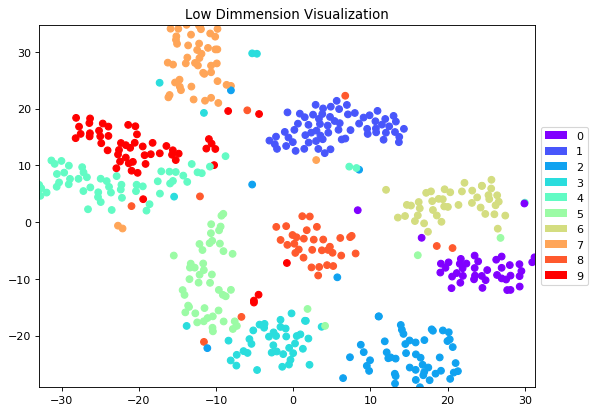

Epoch:  0 | train loss: 0.3264 | test accuracy: 0.97


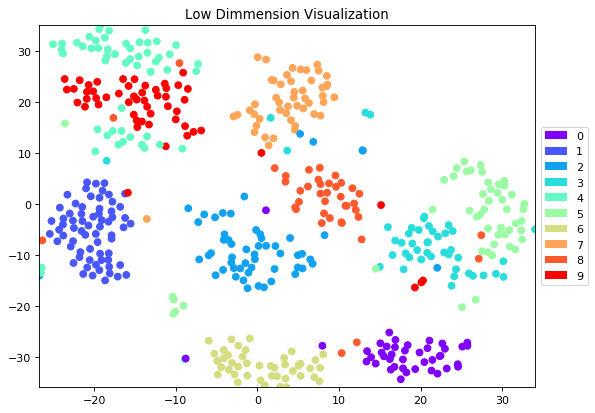

Epoch:  0 | train loss: 0.0042 | test accuracy: 0.97


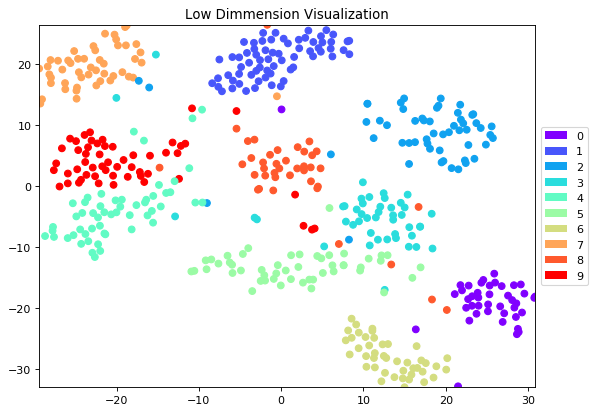

Epoch:  0 | train loss: 0.0399 | test accuracy: 0.96


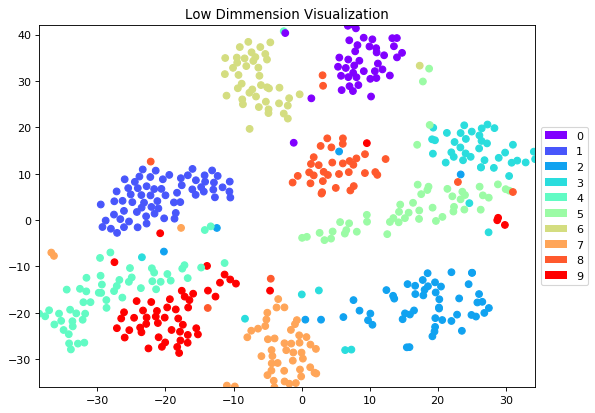

Epoch:  0 | train loss: 0.0099 | test accuracy: 0.96


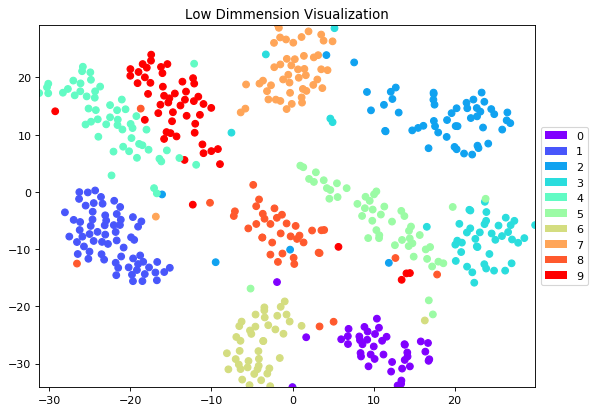

Epoch:  0 | train loss: 0.0261 | test accuracy: 0.97


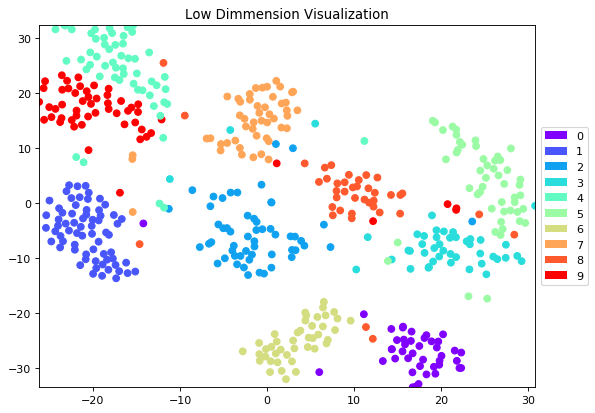

Epoch:  0 | train loss: 0.2322 | test accuracy: 0.95


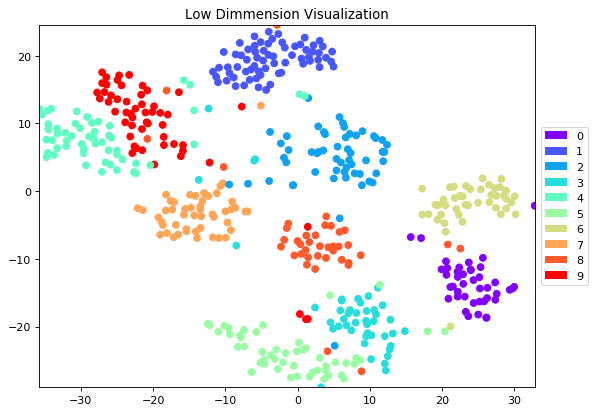

Epoch:  0 | train loss: 0.3130 | test accuracy: 0.97


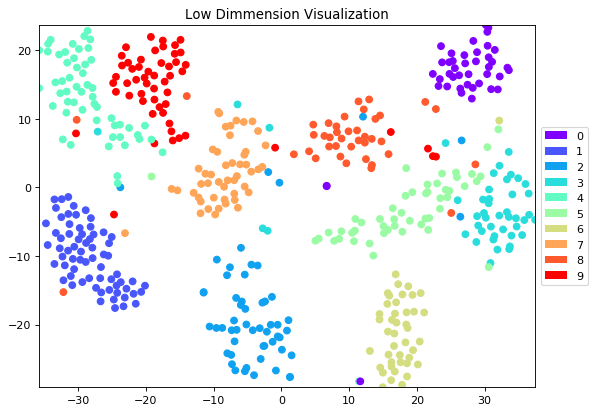

Epoch:  0 | train loss: 0.1476 | test accuracy: 0.96


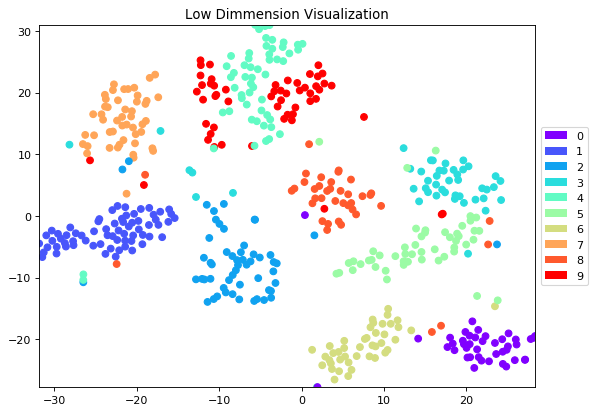

Epoch:  0 | train loss: 0.2402 | test accuracy: 0.97


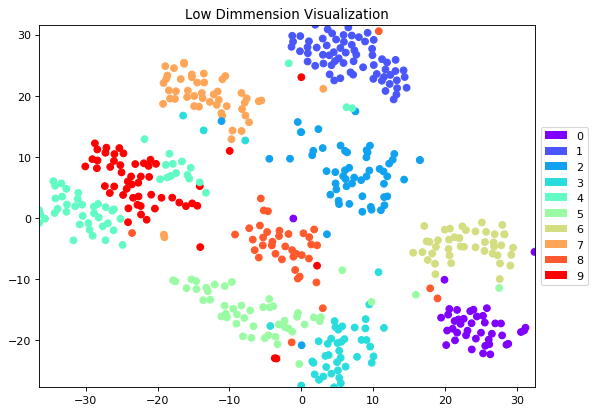

Epoch:  0 | train loss: 0.0092 | test accuracy: 0.97


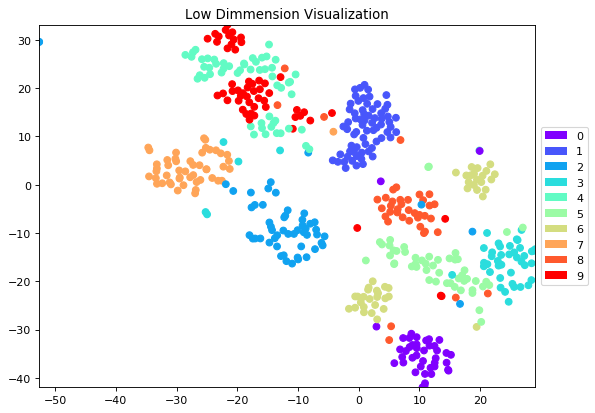

Epoch:  0 | train loss: 0.0138 | test accuracy: 0.97


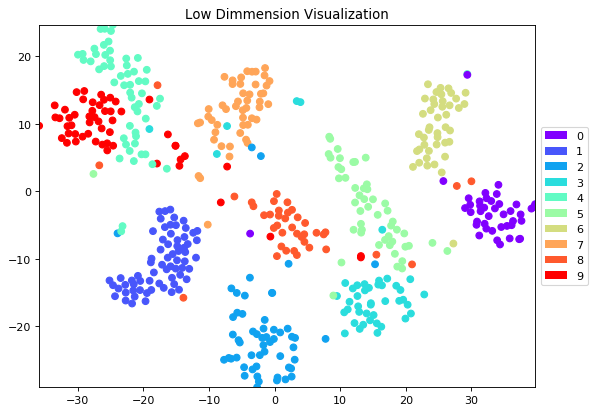

Epoch:  0 | train loss: 0.5766 | test accuracy: 0.97


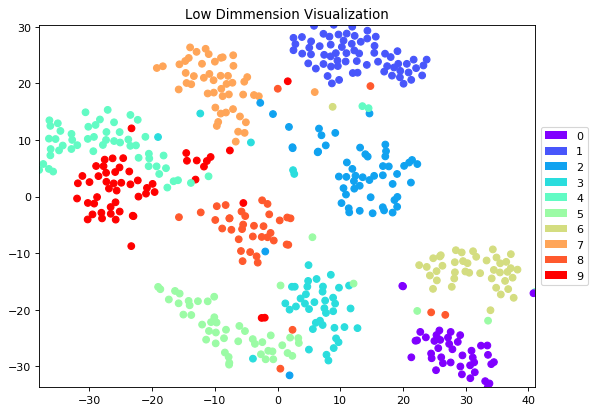

Epoch:  0 | train loss: 0.0444 | test accuracy: 0.97


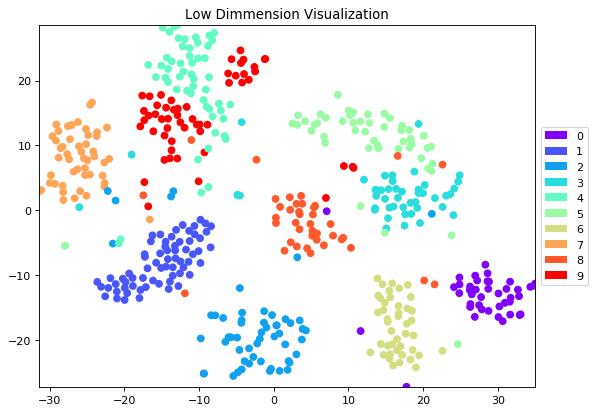

Epoch:  0 | train loss: 0.0354 | test accuracy: 0.97


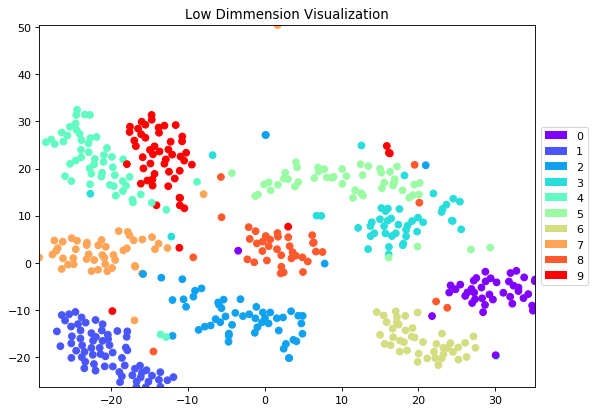

Epoch:  0 | train loss: 0.0249 | test accuracy: 0.97


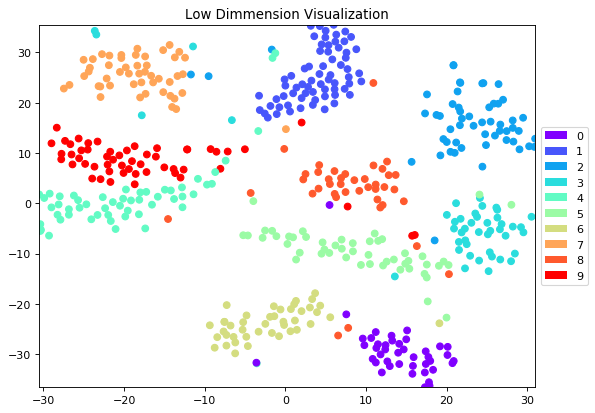

Epoch:  0 | train loss: 0.0217 | test accuracy: 0.97


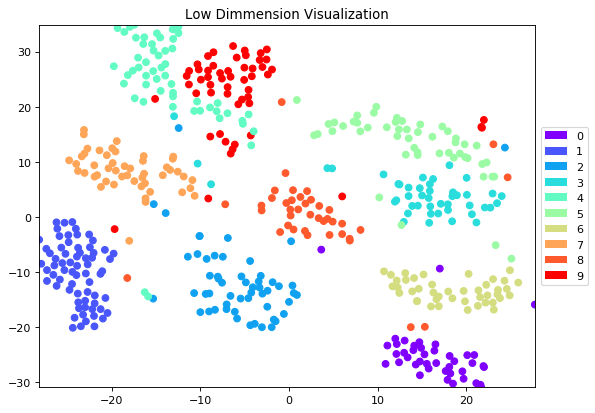

Epoch:  0 | train loss: 0.0075 | test accuracy: 0.97


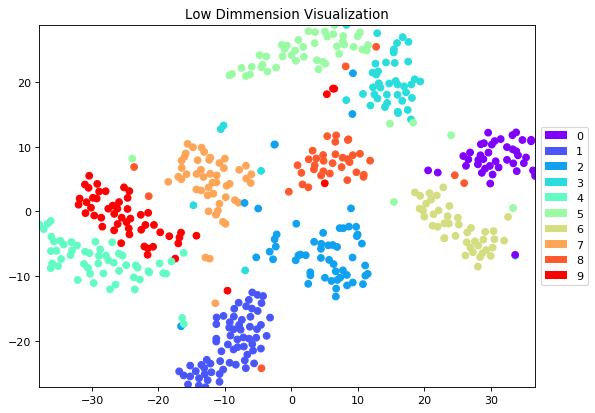

Epoch:  0 | train loss: 0.0076 | test accuracy: 0.97


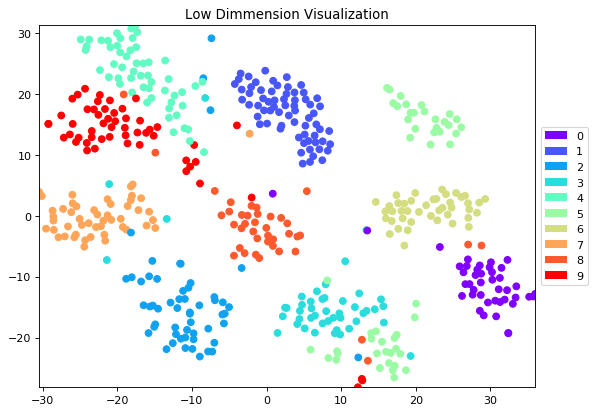

Epoch:  0 | train loss: 0.0328 | test accuracy: 0.97


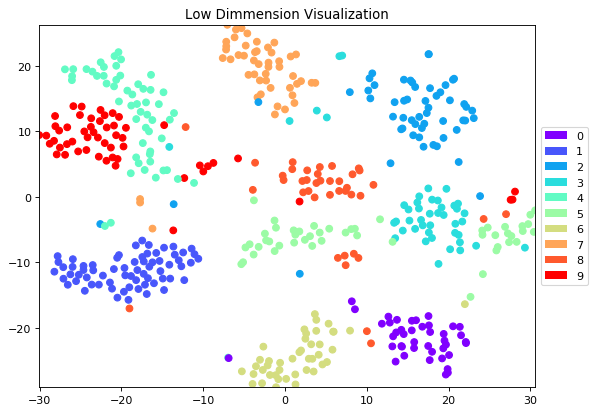

Epoch:  0 | train loss: 0.5788 | test accuracy: 0.97


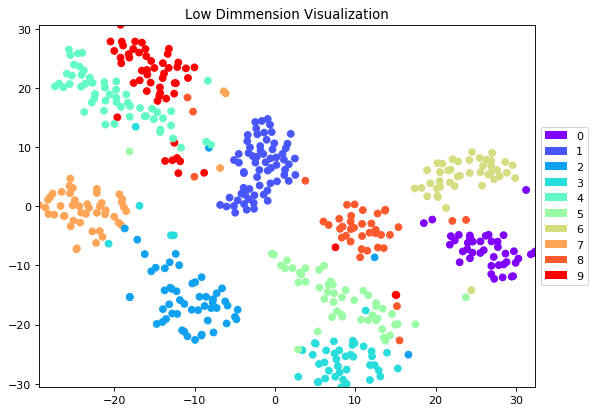

Epoch:  0 | train loss: 0.0243 | test accuracy: 0.97


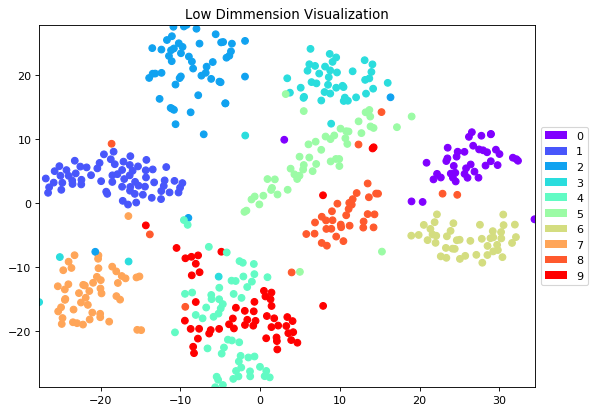

Epoch:  0 | train loss: 0.0090 | test accuracy: 0.97


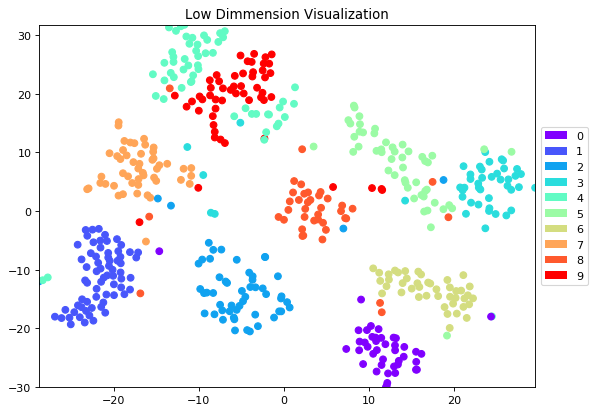

Epoch:  0 | train loss: 0.0137 | test accuracy: 0.97


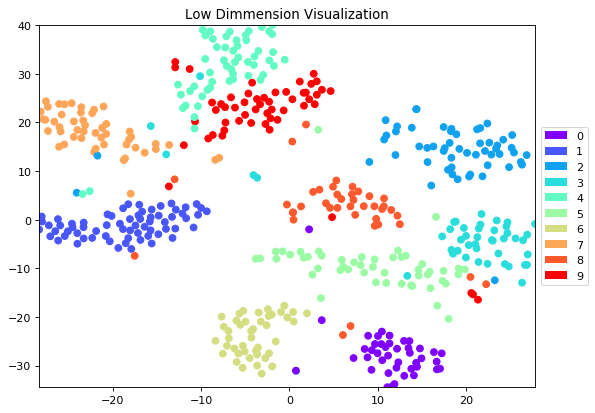

Epoch:  0 | train loss: 0.0278 | test accuracy: 0.97


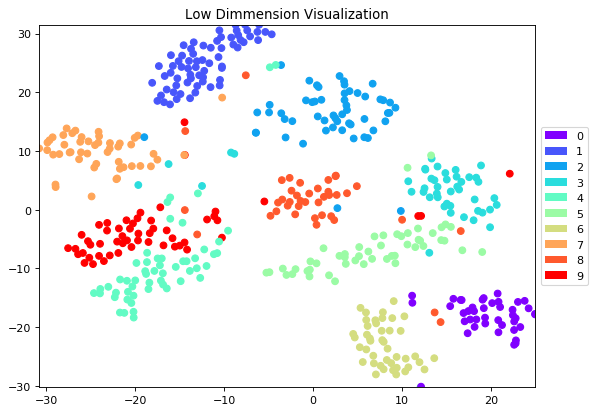

Epoch:  0 | train loss: 0.0270 | test accuracy: 0.98


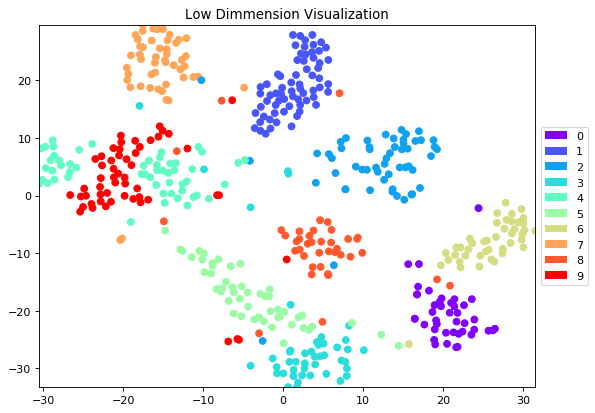

Epoch:  0 | train loss: 0.0267 | test accuracy: 0.98


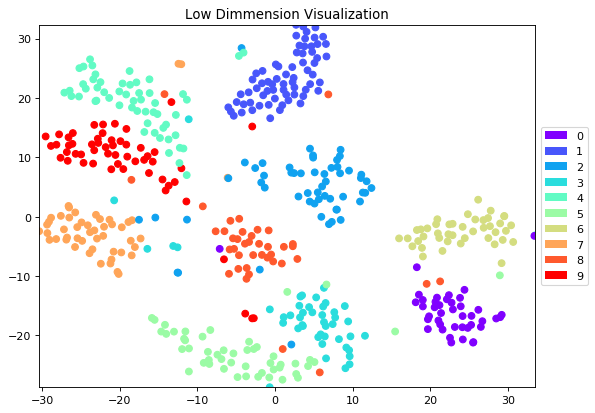

Epoch:  0 | train loss: 0.0171 | test accuracy: 0.98


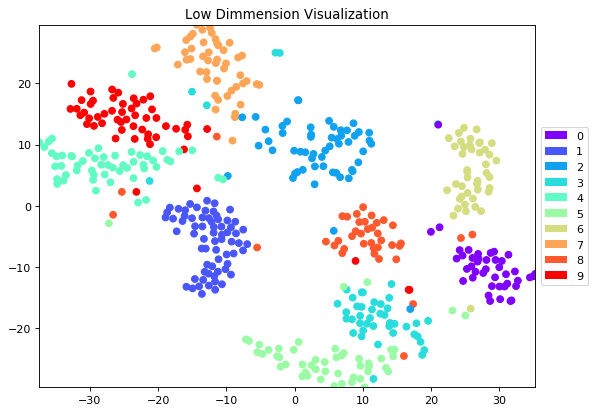

Epoch:  0 | train loss: 0.2875 | test accuracy: 0.97


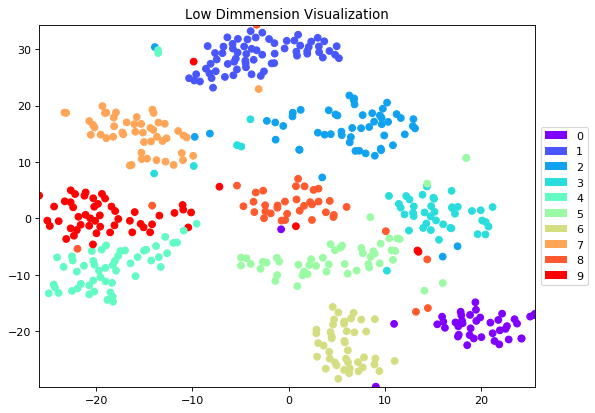

Epoch:  0 | train loss: 0.1959 | test accuracy: 0.98


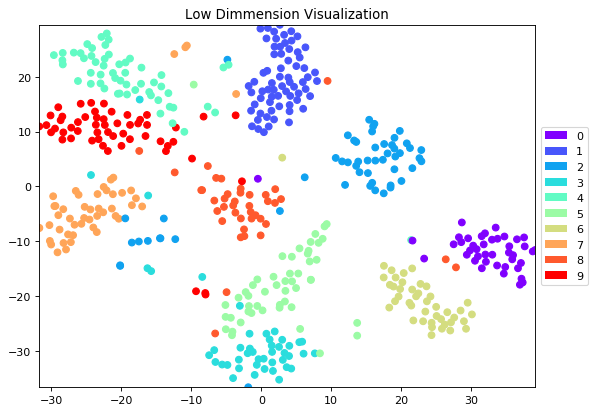

Epoch:  0 | train loss: 0.0038 | test accuracy: 0.98


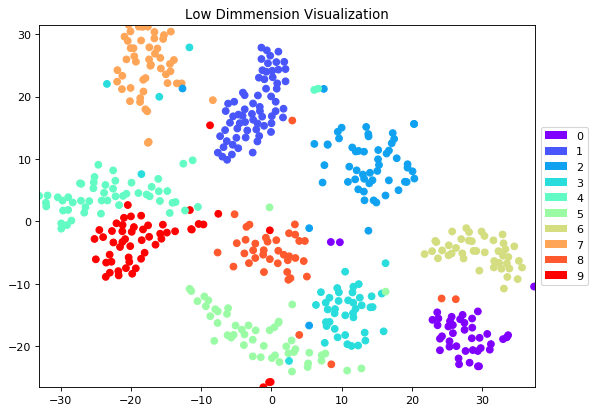

Epoch:  0 | train loss: 0.1266 | test accuracy: 0.97


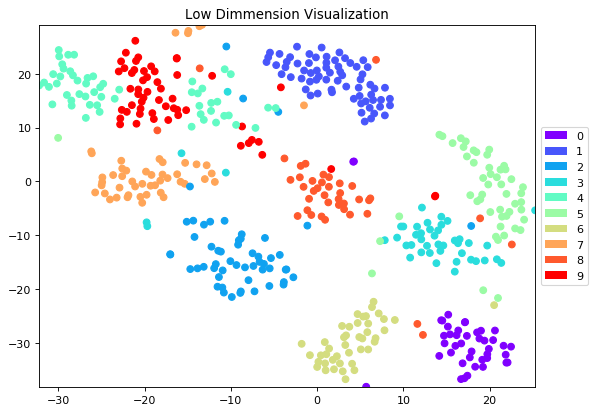

Epoch:  0 | train loss: 0.0780 | test accuracy: 0.98


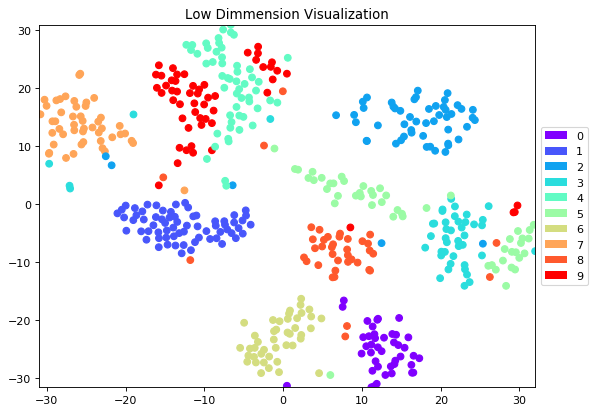

Epoch:  0 | train loss: 0.0426 | test accuracy: 0.98


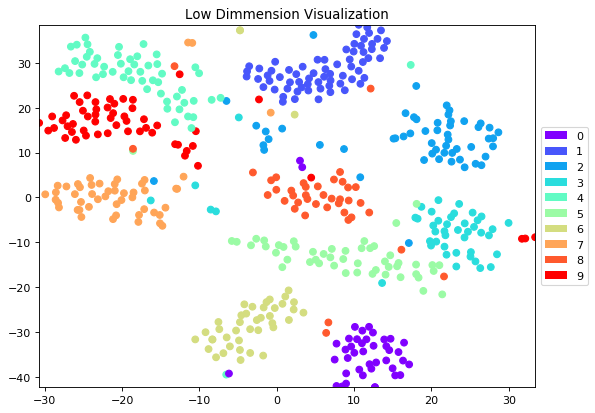

Epoch:  0 | train loss: 0.1095 | test accuracy: 0.98


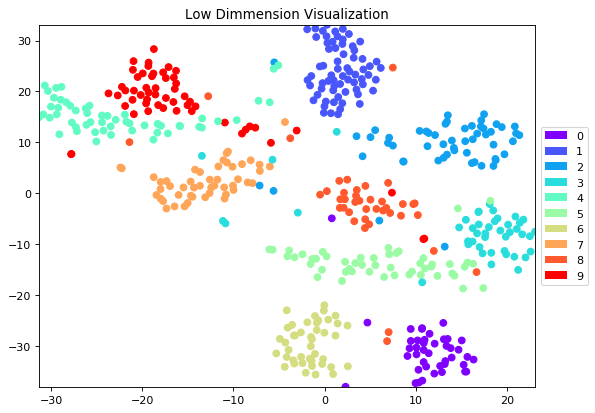

Epoch:  0 | train loss: 0.0376 | test accuracy: 0.97


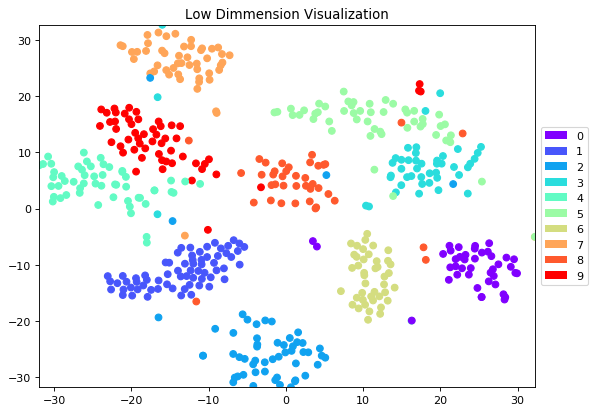

Epoch:  0 | train loss: 0.3847 | test accuracy: 0.97


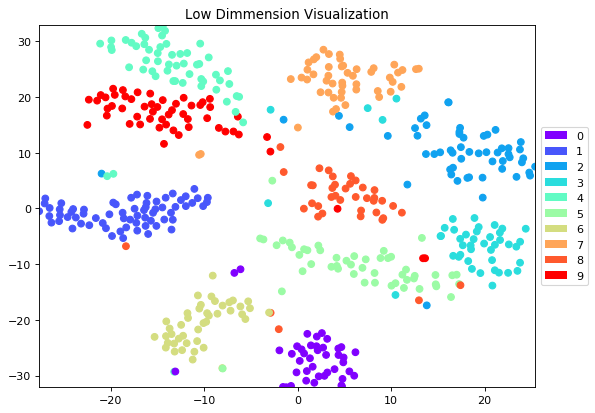

Epoch:  0 | train loss: 0.0269 | test accuracy: 0.98


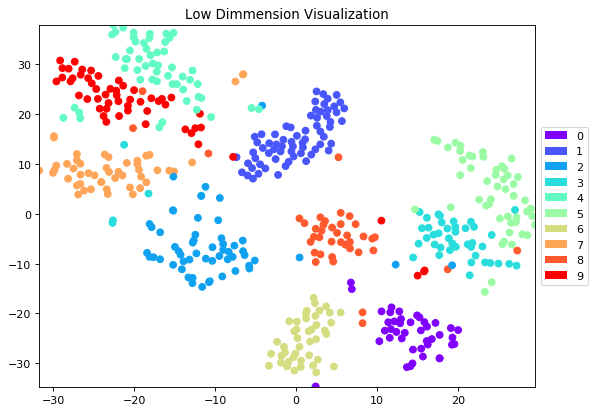

Epoch:  0 | train loss: 0.0874 | test accuracy: 0.98


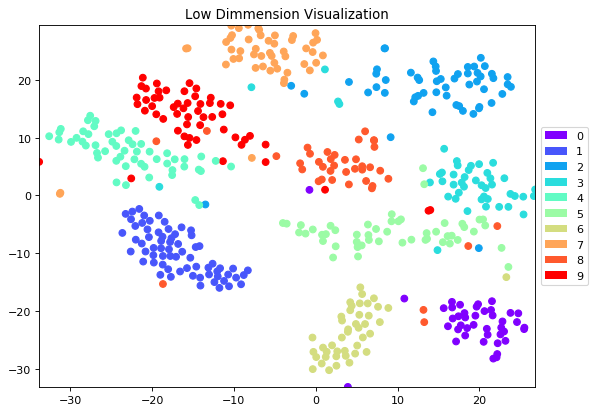

Epoch:  0 | train loss: 0.1253 | test accuracy: 0.97


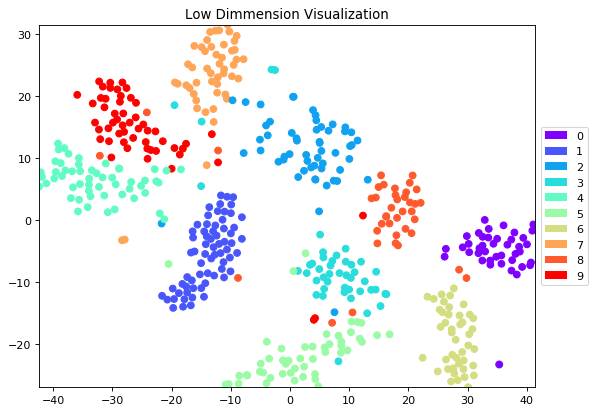

Epoch:  0 | train loss: 0.0554 | test accuracy: 0.98


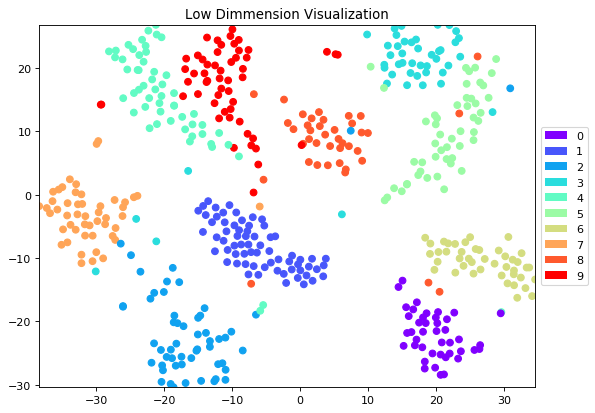

Epoch:  0 | train loss: 0.0439 | test accuracy: 0.97


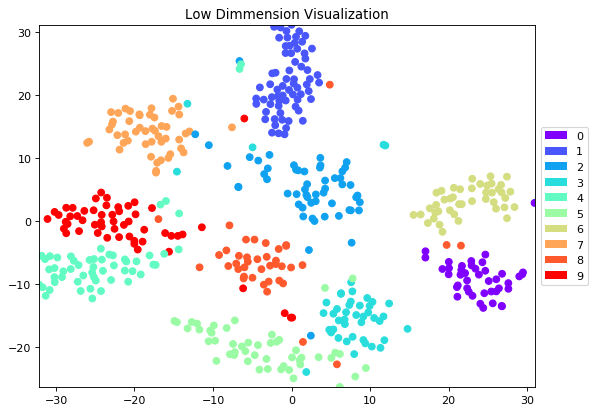

Epoch:  0 | train loss: 0.0142 | test accuracy: 0.98


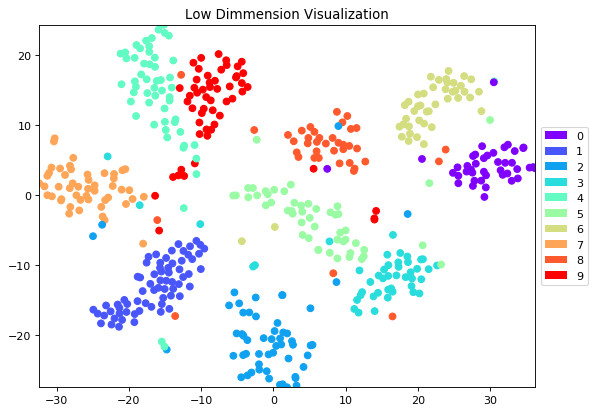

Epoch:  0 | train loss: 0.0198 | test accuracy: 0.98


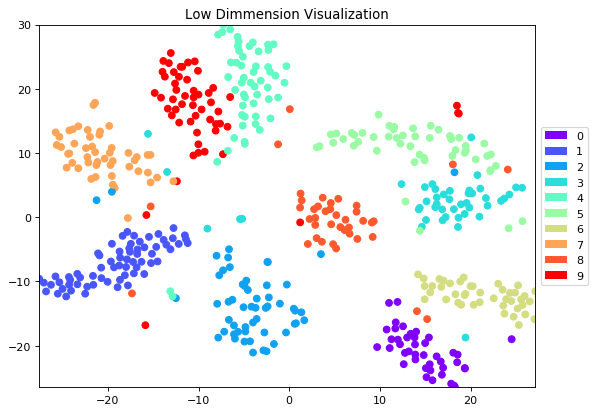

Epoch:  0 | train loss: 0.0071 | test accuracy: 0.98


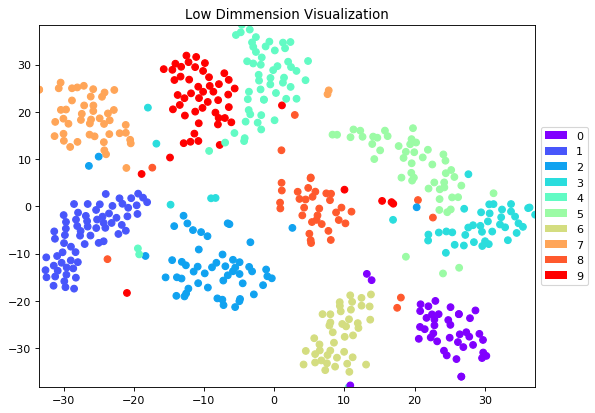

Epoch:  0 | train loss: 0.0177 | test accuracy: 0.98


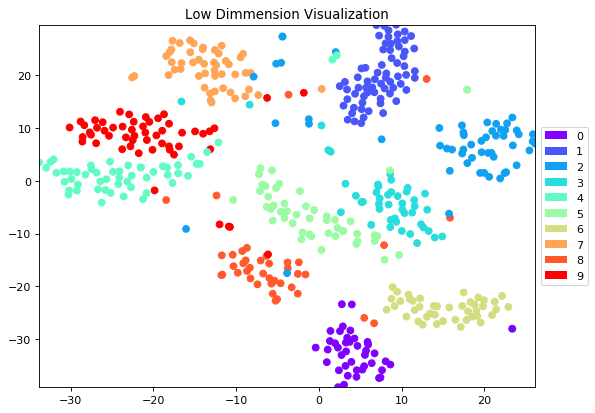

Epoch:  0 | train loss: 0.3230 | test accuracy: 0.98


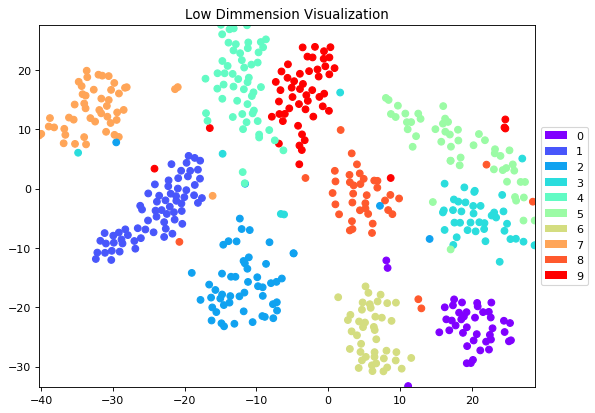

Epoch:  0 | train loss: 0.0509 | test accuracy: 0.97


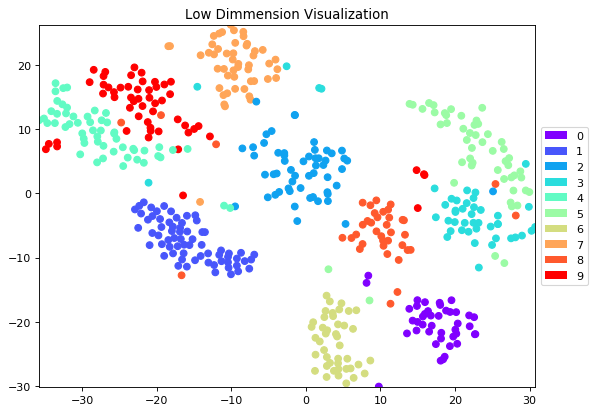

Epoch:  0 | train loss: 0.0109 | test accuracy: 0.97


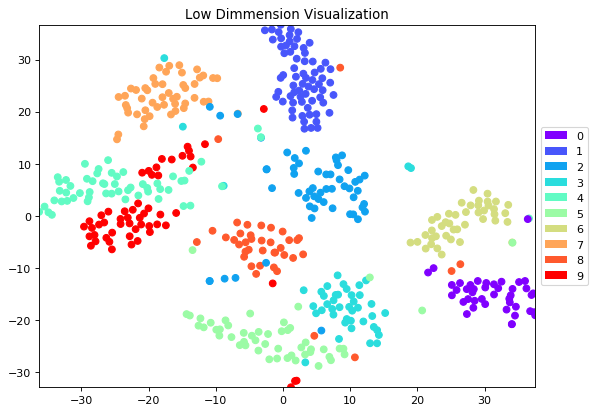

Epoch:  0 | train loss: 0.0056 | test accuracy: 0.97


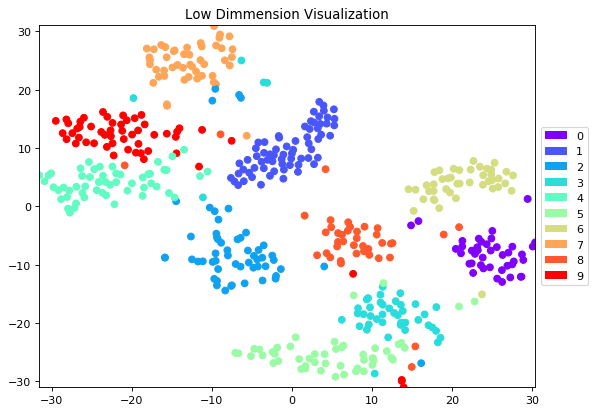

Epoch:  0 | train loss: 0.0288 | test accuracy: 0.97


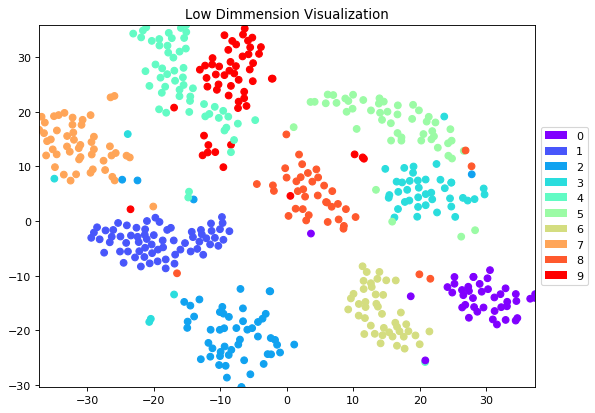

Epoch:  0 | train loss: 0.0107 | test accuracy: 0.98


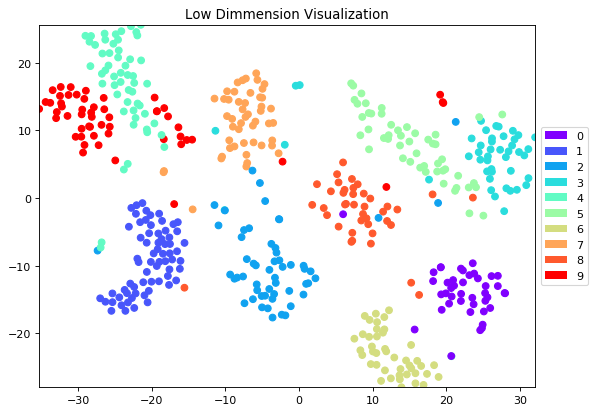

Epoch:  0 | train loss: 0.0281 | test accuracy: 0.98


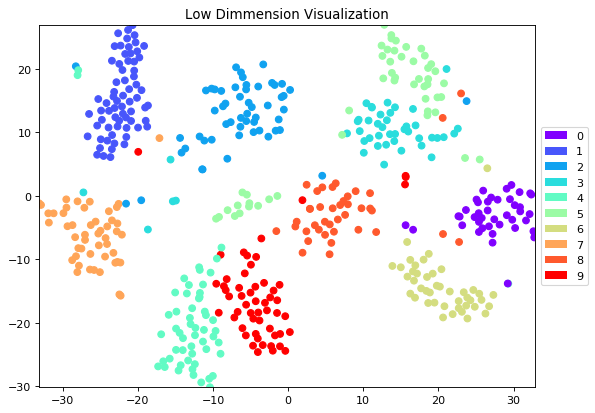

Epoch:  0 | train loss: 0.2346 | test accuracy: 0.98


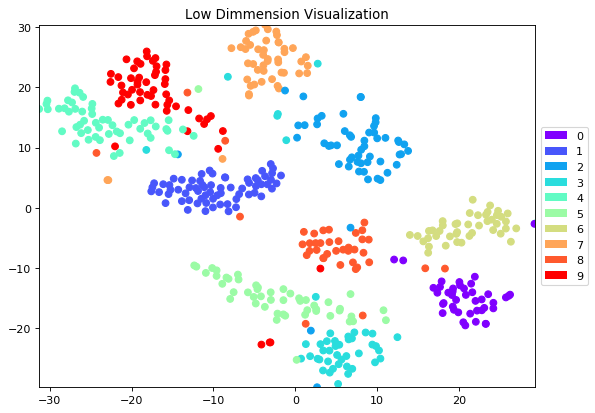

Epoch:  0 | train loss: 0.0693 | test accuracy: 0.98


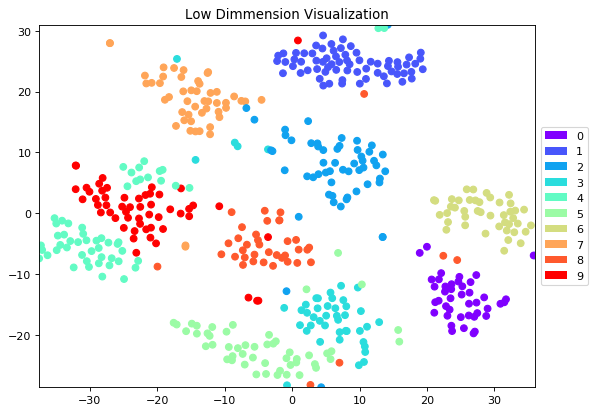

Epoch:  0 | train loss: 0.0884 | test accuracy: 0.98


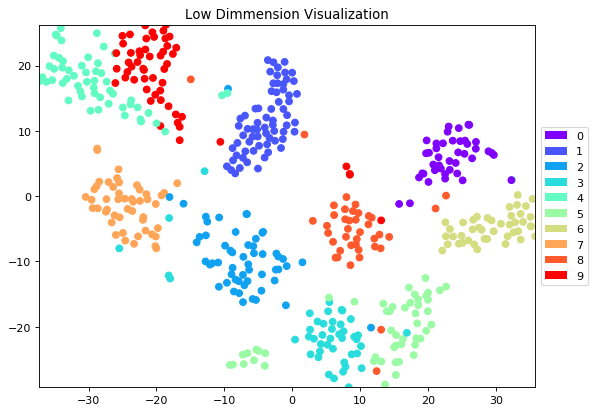

Epoch:  0 | train loss: 0.0786 | test accuracy: 0.97


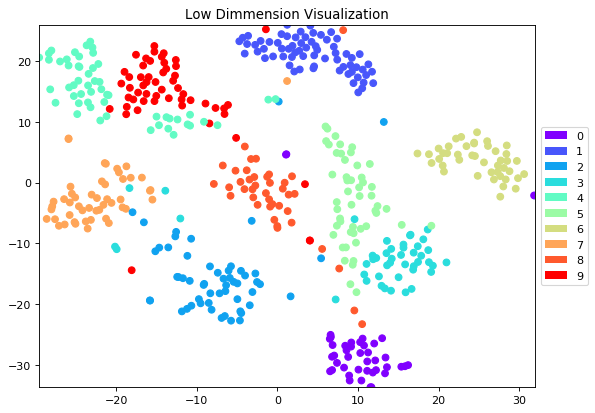

Epoch:  0 | train loss: 0.0063 | test accuracy: 0.97


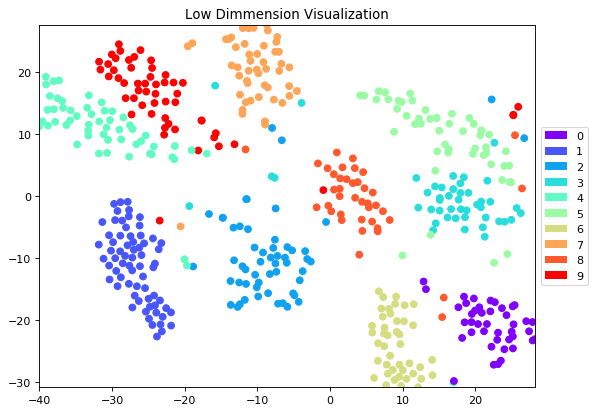

Epoch:  0 | train loss: 0.4926 | test accuracy: 0.98


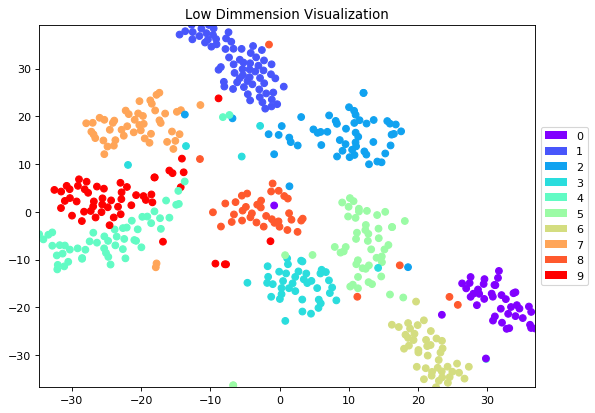

Epoch:  0 | train loss: 0.0068 | test accuracy: 0.98


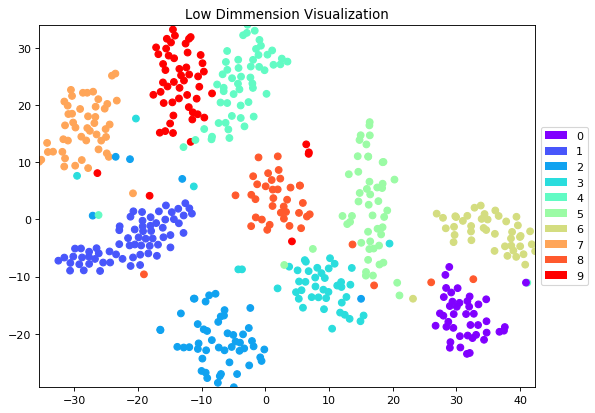

Epoch:  0 | train loss: 0.0015 | test accuracy: 0.98


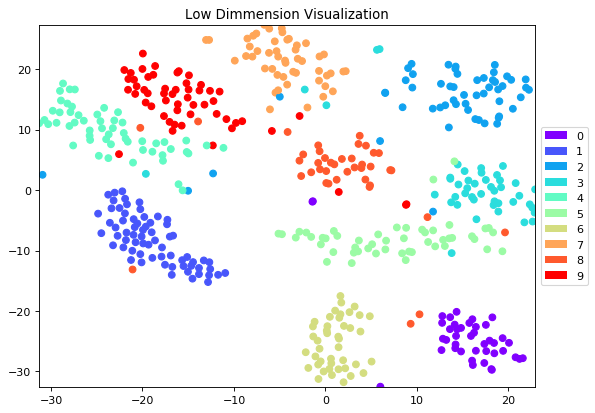

Epoch:  0 | train loss: 0.0703 | test accuracy: 0.98


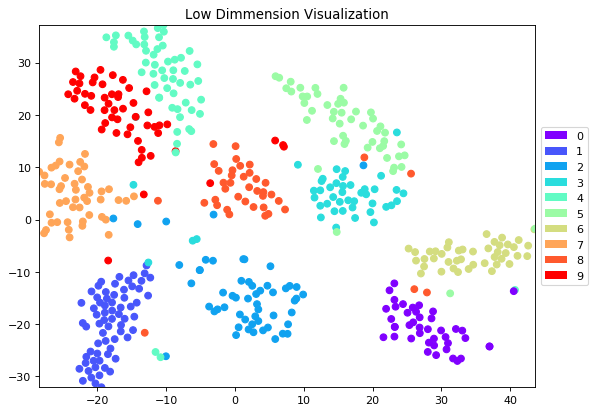

Epoch:  0 | train loss: 0.1119 | test accuracy: 0.98


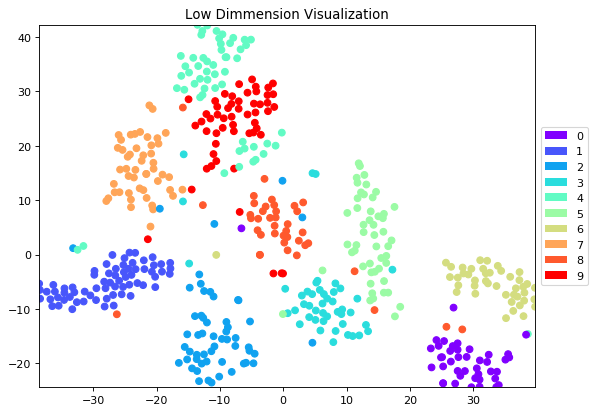

Epoch:  0 | train loss: 0.0291 | test accuracy: 0.98


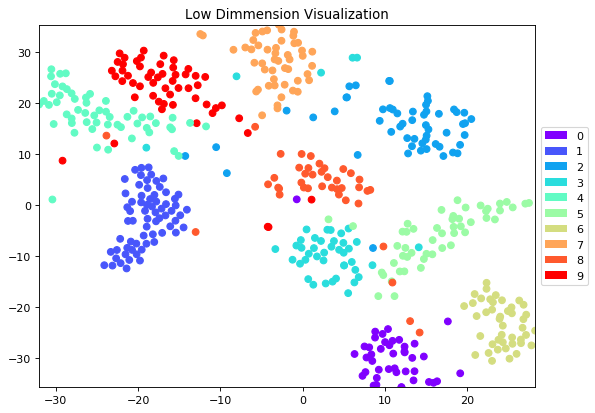

Epoch:  0 | train loss: 0.0288 | test accuracy: 0.98


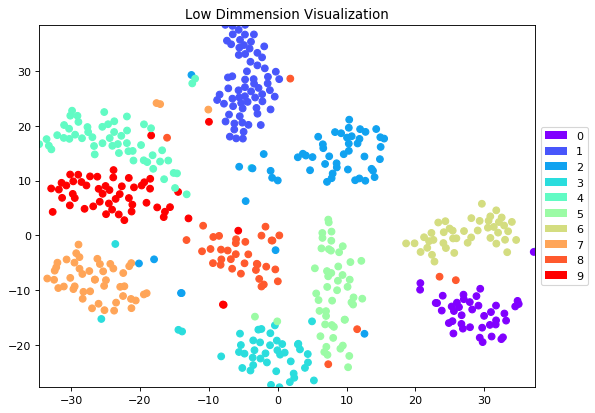

Epoch:  0 | train loss: 0.1070 | test accuracy: 0.98


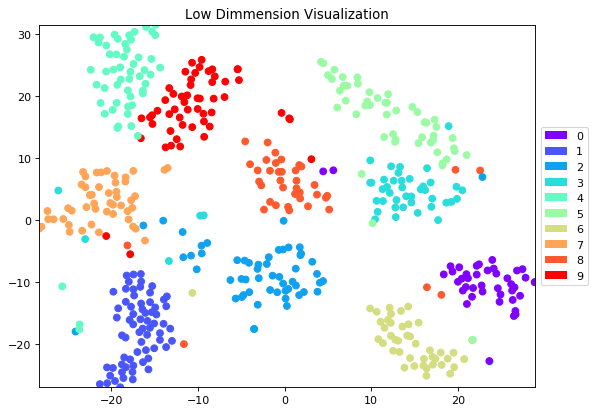

Epoch:  0 | train loss: 0.0194 | test accuracy: 0.98


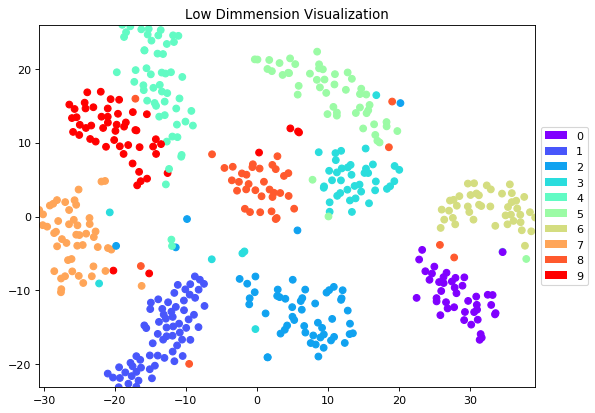

Epoch:  0 | train loss: 0.0021 | test accuracy: 0.97


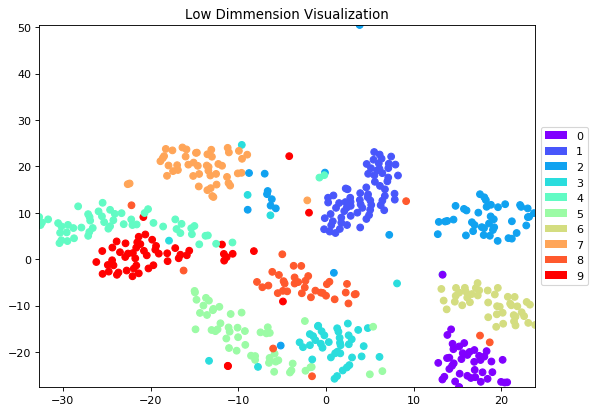

Epoch:  0 | train loss: 0.0067 | test accuracy: 0.98


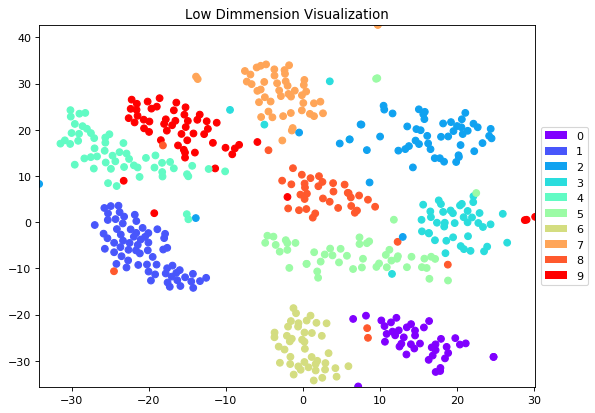

Epoch:  0 | train loss: 0.0012 | test accuracy: 0.98


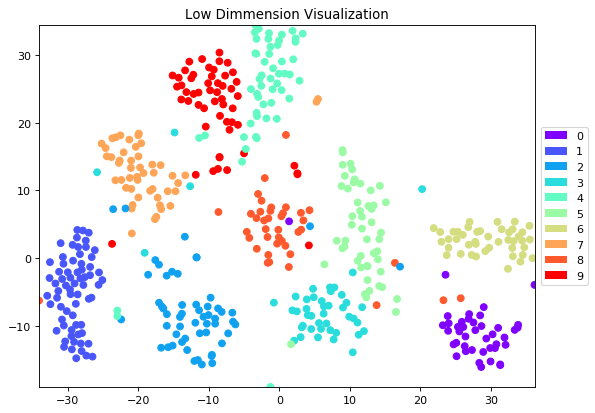

Epoch:  0 | train loss: 0.0015 | test accuracy: 0.98


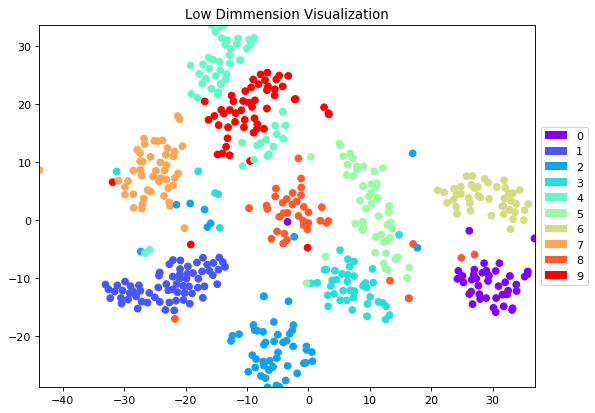

Epoch:  0 | train loss: 0.0088 | test accuracy: 0.97


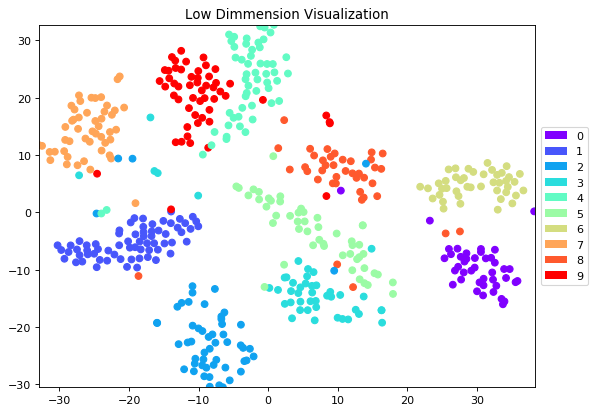

Epoch:  0 | train loss: 0.0289 | test accuracy: 0.98


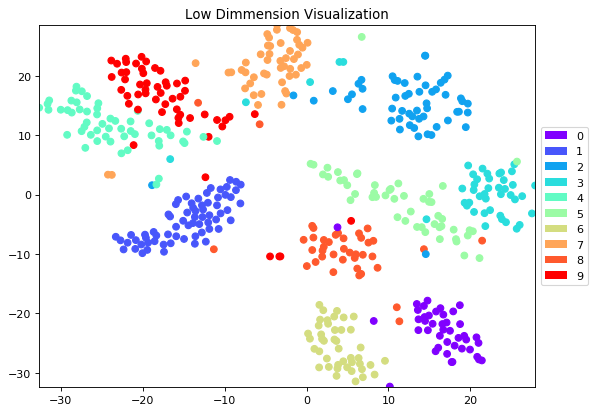

Epoch:  0 | train loss: 0.0054 | test accuracy: 0.98


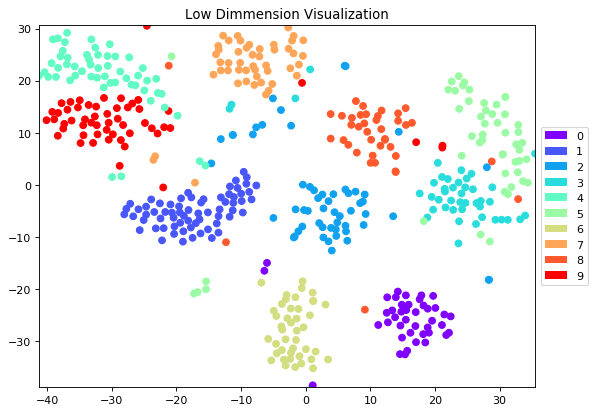

Epoch:  0 | train loss: 0.0990 | test accuracy: 0.98


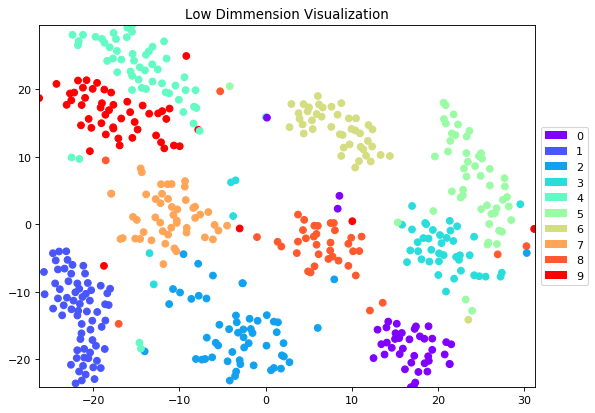

Epoch:  0 | train loss: 0.0032 | test accuracy: 0.97


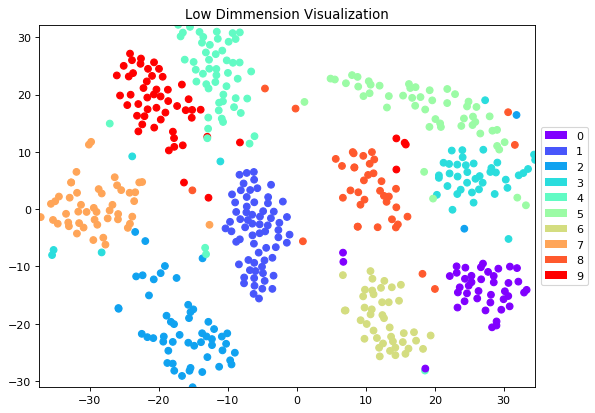

Epoch:  0 | train loss: 0.0093 | test accuracy: 0.97


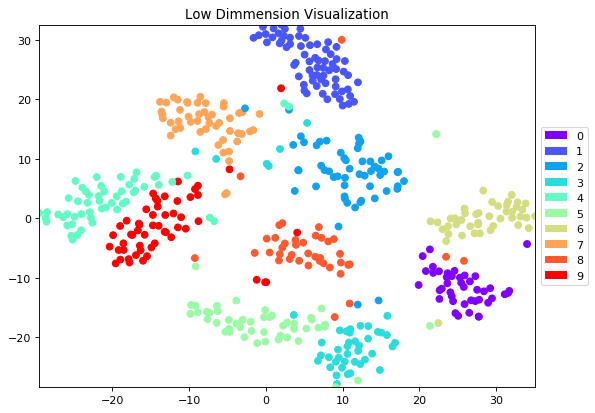

Epoch:  0 | train loss: 0.0028 | test accuracy: 0.97


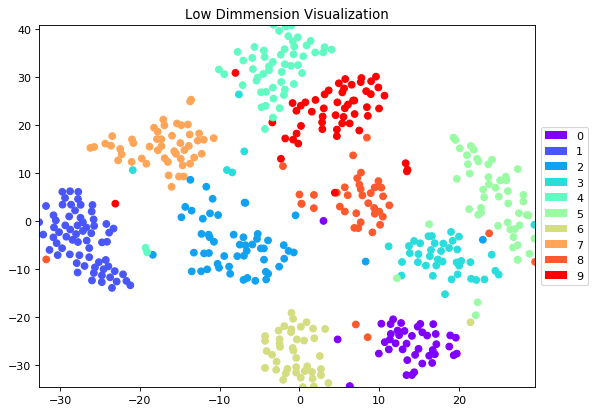

Epoch:  0 | train loss: 0.0963 | test accuracy: 0.97


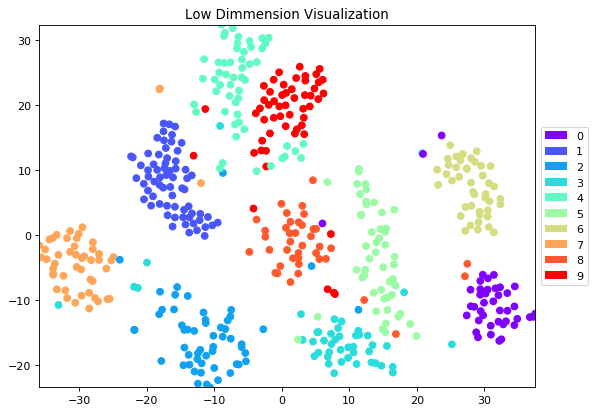

Epoch:  0 | train loss: 0.1747 | test accuracy: 0.98


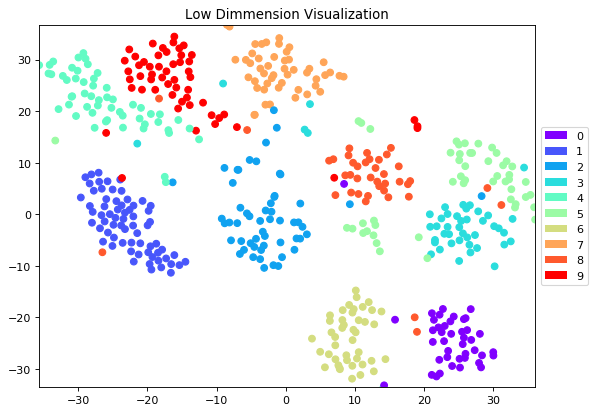

Epoch:  0 | train loss: 0.0380 | test accuracy: 0.97


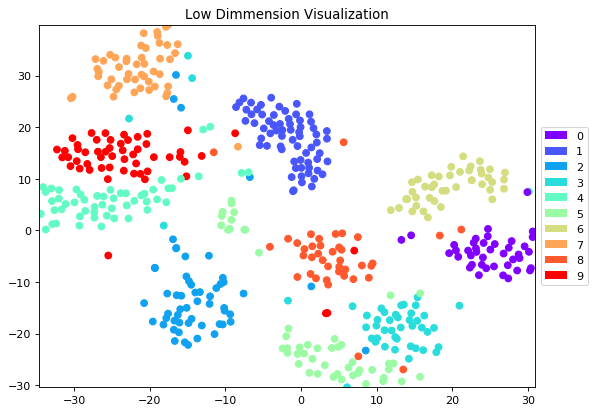

Epoch:  0 | train loss: 0.0547 | test accuracy: 0.98


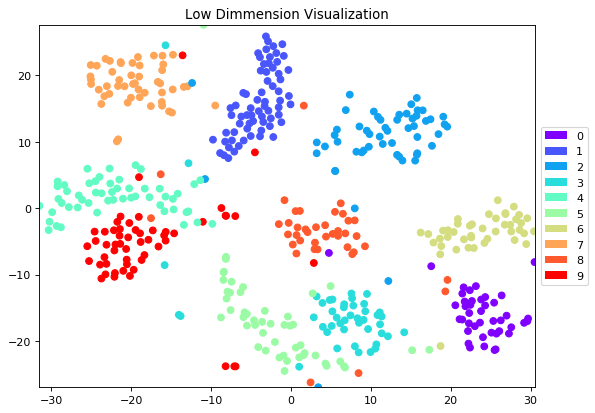

Epoch:  0 | train loss: 0.0230 | test accuracy: 0.98


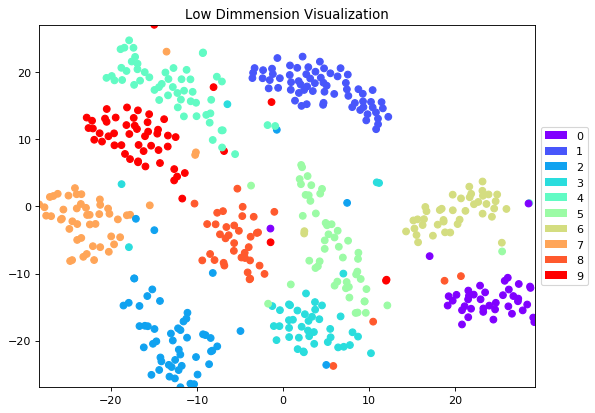

Epoch:  0 | train loss: 0.0594 | test accuracy: 0.98


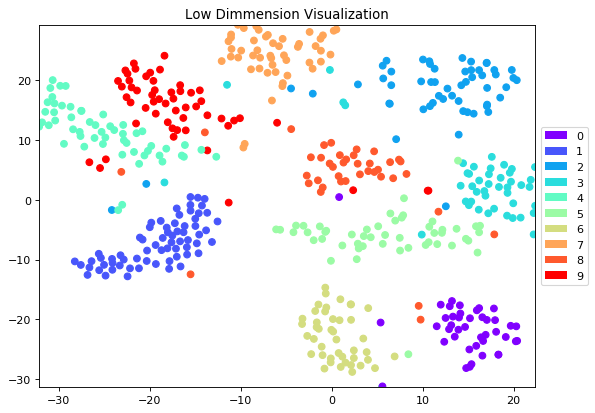

Epoch:  0 | train loss: 0.0196 | test accuracy: 0.98


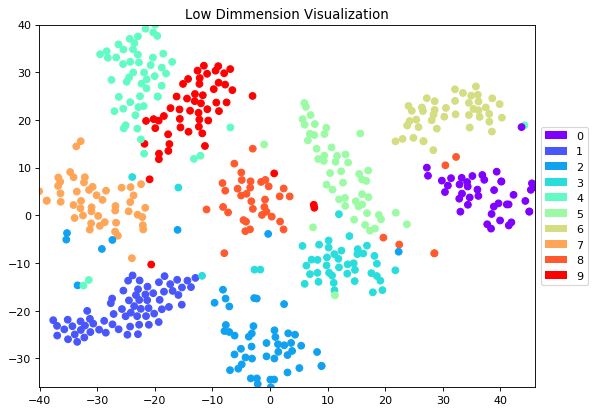

Epoch:  0 | train loss: 0.0339 | test accuracy: 0.98


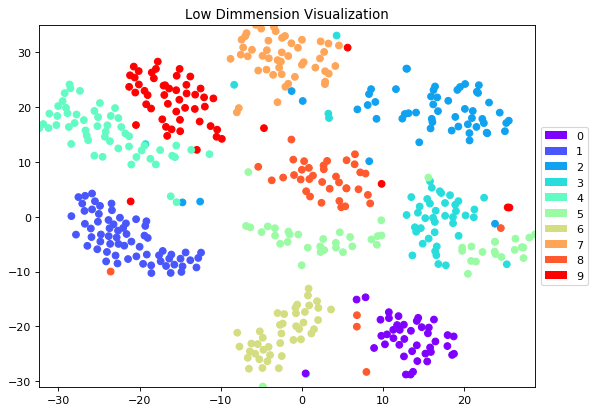

Epoch:  0 | train loss: 0.0160 | test accuracy: 0.98


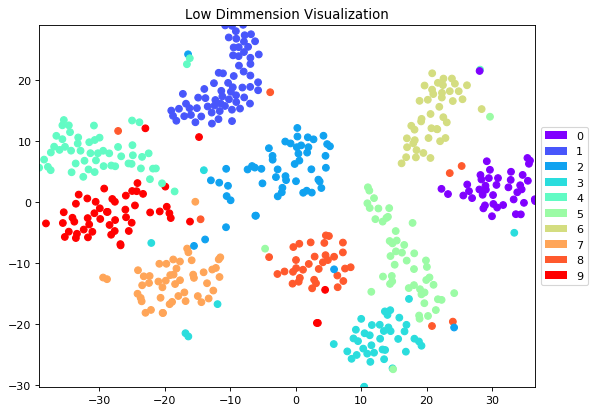

Epoch:  0 | train loss: 0.0150 | test accuracy: 0.98


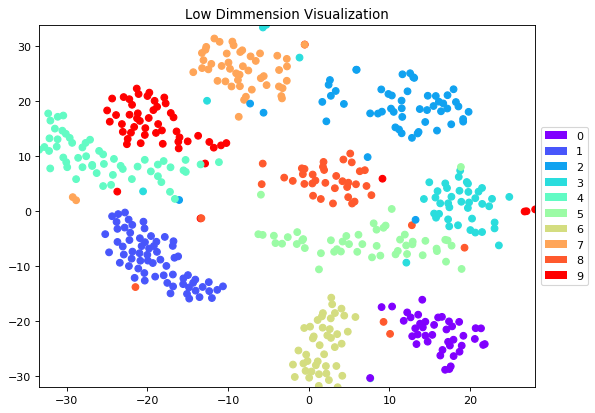

Epoch:  0 | train loss: 0.0623 | test accuracy: 0.98


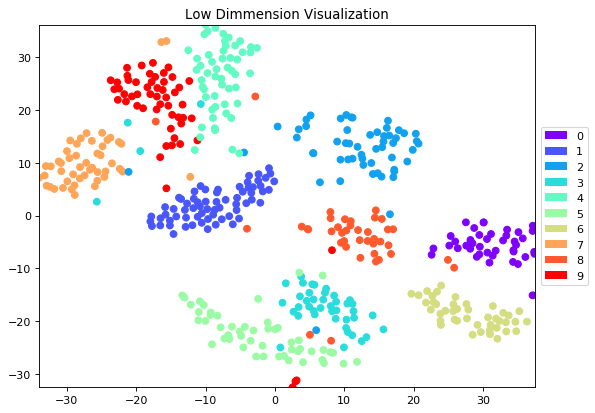

Epoch:  0 | train loss: 0.0019 | test accuracy: 0.97


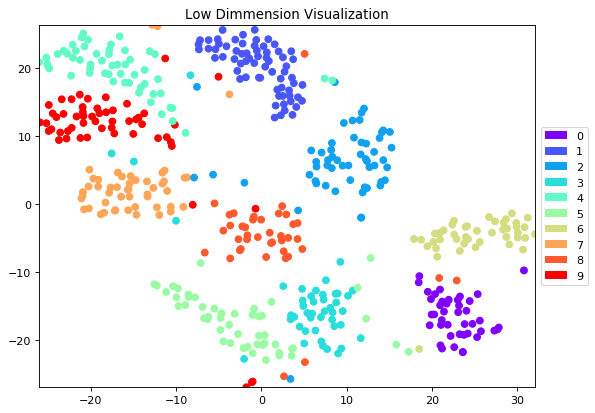

Epoch:  0 | train loss: 0.0233 | test accuracy: 0.98


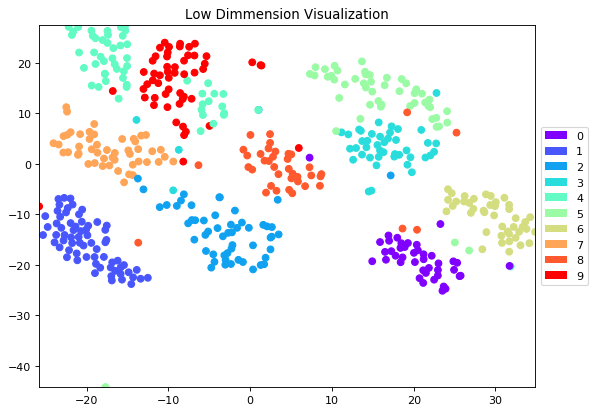

Epoch:  0 | train loss: 0.0039 | test accuracy: 0.98


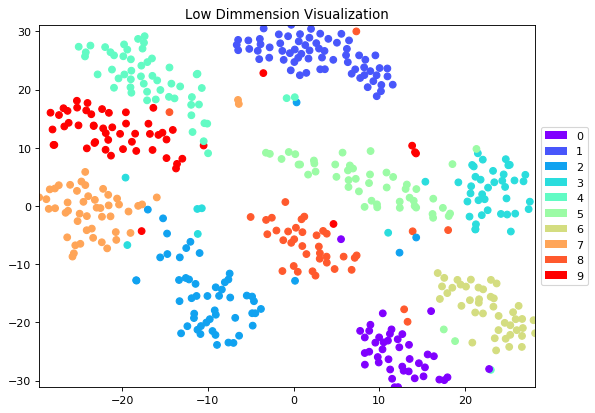

Epoch:  0 | train loss: 0.0174 | test accuracy: 0.98


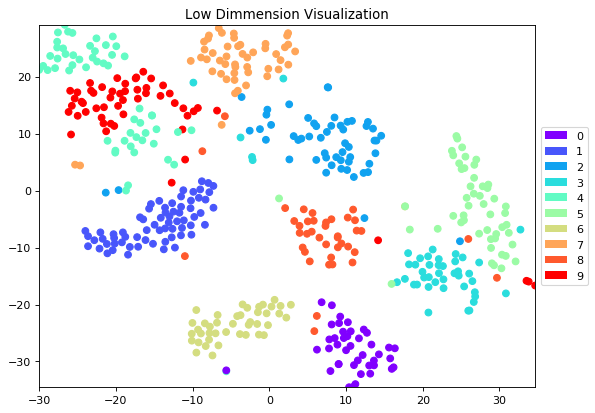

Epoch:  0 | train loss: 0.0140 | test accuracy: 0.97


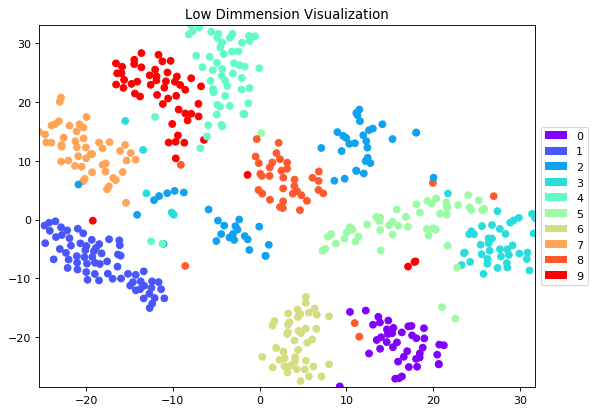

Epoch:  0 | train loss: 0.0137 | test accuracy: 0.98


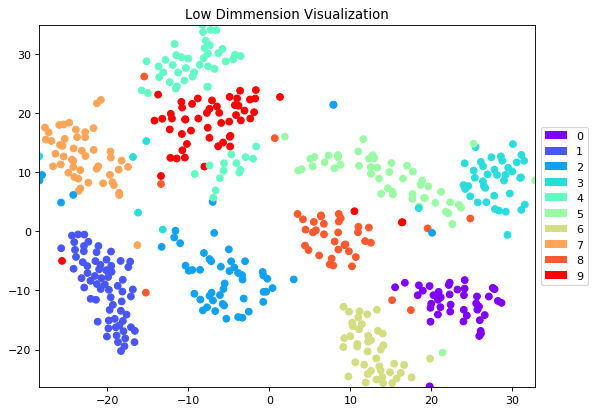

Epoch:  0 | train loss: 0.0099 | test accuracy: 0.98


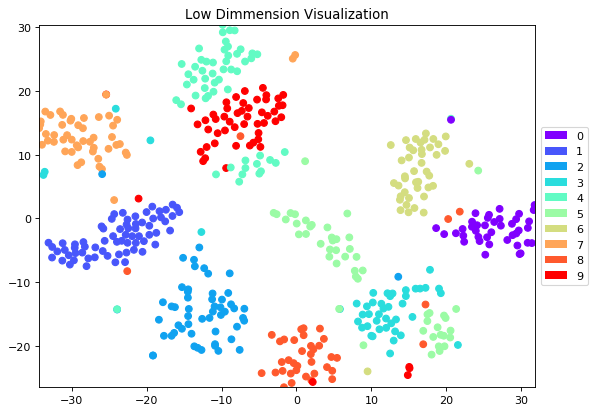

Epoch:  0 | train loss: 0.0246 | test accuracy: 0.98


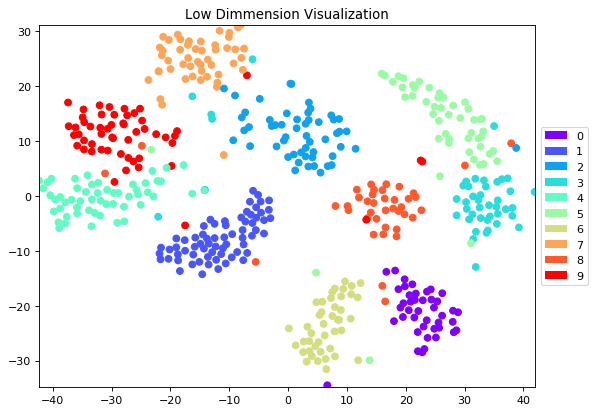

Epoch:  0 | train loss: 0.0039 | test accuracy: 0.97


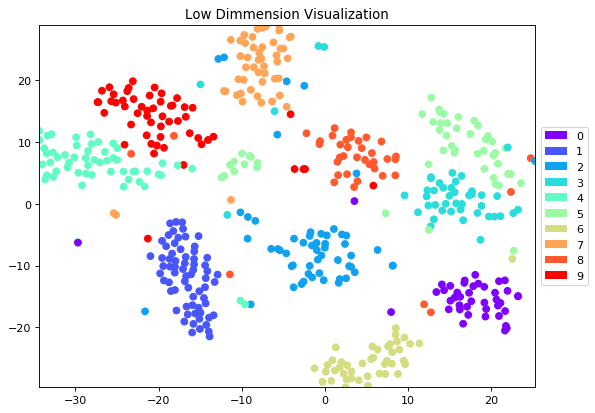

Epoch:  0 | train loss: 0.0111 | test accuracy: 0.98


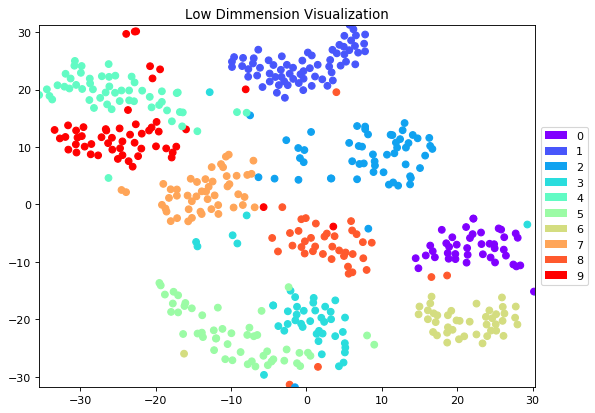

Epoch:  0 | train loss: 0.0048 | test accuracy: 0.98


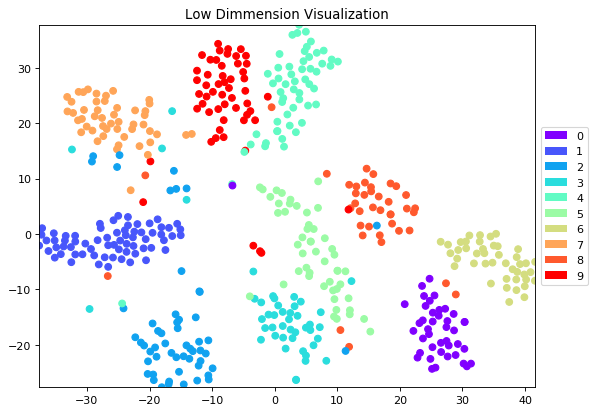

Epoch:  0 | train loss: 0.0030 | test accuracy: 0.98


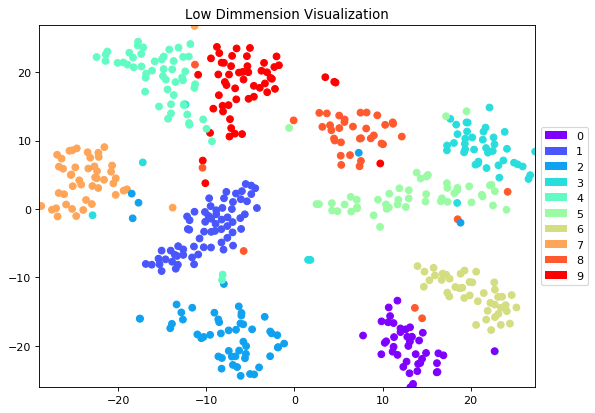

In [37]:
plt.ion()

for epoch in range(EPOCH):
    for step, (b_x, b_y) in enumerate(train_loader):
        output = cnn(b_x)[0]
        loss = loss_func(output, b_y)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        if step % BATCH_SIZE == 0:
            test_output, last_layer = cnn(test_x)
            pred_y = torch.max(test_output, 1)[1].data.numpy()
            accuracy = float((pred_y == test_y.data.numpy()).astype(int).sum()) / float(test_y.size(0))
            print('Epoch: ', epoch, '| train loss: %.4f' % loss.data.numpy(), '| test accuracy: %.2f' % accuracy)
            tsne = TSNE(perplexity=30, n_components=2, init='pca', n_iter=5000)
            plot_only = 500
            low_dim_embs = tsne.fit_transform(last_layer.data.numpy()[:plot_only, :])
            labels = test_y.numpy()[:plot_only]
            low_dimm_visualization(low_dim_embs, labels)
plt.ioff()